<a href="https://colab.research.google.com/github/diyarevankar/Flood-Detection-and-Segmentation-using-Satellite-Images/blob/main/Minor_Total_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, Subset
import tifffile as tiff
import numpy as np
from PIL import Image
from torchvision import transforms
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import matplotlib.pyplot as plt
import pandas as pd
import cv2 # Keep for potential future use or alternative resizing

# Install segmentation_models_pytorch if not already installed
try:
    import segmentation_models_pytorch as smp
except ImportError:
    print("segmentation_models_pytorch not found. Installing...")
    !pip install segmentation_models_pytorch -q
    import segmentation_models_pytorch as smp # Re-import after installation

# IMPORTANT: Add Albumentations for advanced augmentation
try:
    import albumentations as A
    from albumentations.pytorch import ToTensorV2
except ImportError:
    print("Albumentations not found. Installing...")
    !pip install -U albumentations -q
    import albumentations as A
    from albumentations.pytorch import ToTensorV2

# 1. Mount your personal Google Drive (Keep this part as is)
from google.colab import drive
drive.mount('/content/drive')
print("Google Drive Mounted.")



/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.8' (you have '2.0.7'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Google Drive Mounted.


In [ ]:
# --- Paths --- (Keep this part as is)
base_path = '/content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled'
images_dir = os.path.join(base_path, 'S1Hand')
masks_dir = os.path.join(base_path, 'LabelHand')
model_weights_dir = os.path.join(base_path, 'model_weights_update') # Using your specified new directory
os.makedirs(model_weights_dir, exist_ok=True) # Ensure directory exists

# Set the device to CUDA if available, otherwise CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"\nUsing device: {device}")


Using device: cuda


In [ ]:
# --- Define Albumentations Augmentation Pipelines ---
# These now include A.Normalize, which will be updated dynamically
# by the set_normalization_params method.

train_transform = A.Compose([
    A.Resize(256, 256),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.Transpose(p=0.5),
    A.ShiftScaleRotate(
        shift_limit=0.0625, scale_limit=0.1, rotate_limit=10, p=0.5,
        border_mode=cv2.BORDER_CONSTANT
    ),
    A.OneOf([
        A.ElasticTransform(p=0.2, alpha=120, sigma=120 * 0.05, alpha_affine=120 * 0.03, border_mode=cv2.BORDER_CONSTANT),
        A.GridDistortion(p=0.2, border_mode=cv2.BORDER_CONSTANT),
        A.OpticalDistortion(p=0.2, distort_limit=2, shift_limit=0.5, border_mode=cv2.BORDER_CONSTANT)
    ], p=0.3),
    A.OneOf([
        A.GaussNoise(var_limit=(10.0, 50.0), p=0.3),
        A.Blur(blur_limit=3, p=0.2),
        A.MedianBlur(blur_limit=3, p=0.2)
    ], p=0.2),
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.3), # Still here, but be mindful for SAR
    A.Normalize(
        mean=[0.0, 0.0],  # Placeholder: will be updated dynamically
        std=[1.0, 1.0],   # Placeholder: will be updated dynamically
        max_pixel_value=1.0 # Crucial: Your SAR data is already in [0,1]
    ),
    ToTensorV2(transpose_mask=True),
])

val_test_transform = A.Compose([
    A.Resize(256, 256),
    A.Normalize(
        mean=[0.0, 0.0],  # Placeholder: will be updated dynamically
        std=[1.0, 1.0],   # Placeholder: will be updated dynamically
        max_pixel_value=1.0
    ),
    ToTensorV2(transpose_mask=True),
])


/usr/local/lib/python3.11/dist-packages/albumentations/core/validation.py:111: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
<ipython-input-3-9aa965ce19af>:16: UserWarning: Argument(s) 'alpha_affine' are not valid for transform ElasticTransform
  A.ElasticTransform(p=0.2, alpha=120, sigma=120 * 0.05, alpha_affine=120 * 0.03, border_mode=cv2.BORDER_CONSTANT),
<ipython-input-3-9aa965ce19af>:18: UserWarning: Argument(s) 'shift_limit' are not valid for transform OpticalDistortion
  A.OpticalDistortion(p=0.2, distort_limit=2, shift_limit=0.5, border_mode=cv2.BORDER_CONSTANT)
<ipython-input-3-9aa965ce19af>:21: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10.0, 50.0), p=0.3),


In [ ]:
# --- FloodDataset Class Definition (MODIFIED for Albumentations and Dynamic Normalization) ---
class FloodDataset(Dataset):
    def __init__(self, images_dir, masks_dir, augmentation=None): # Removed img_mean, img_std from __init__
        self.images_dir = images_dir
        self.masks_dir = masks_dir
        self.augmentation = augmentation # Store the augmentation pipeline

        self.image_filenames = sorted([f for f in os.listdir(images_dir) if f.endswith('.tif')])
        self.mask_filenames = sorted([f for f in os.listdir(masks_dir) if f.endswith('.tif')])

        base_names_image = {f.replace('_S1Hand.tif', '') for f in self.image_filenames}
        base_names_mask = {f.replace('_LabelHand.tif', '') for f in self.mask_filenames}

        self.common_base_names = sorted(list(base_names_image.intersection(base_names_mask)))

        if not self.common_base_names:
            raise ValueError("No matching image-mask pairs found. Check file naming conventions and directories.")

        print(f"Found {len(self.common_base_names)} matching image-mask pairs.")

        # Removed self.image_resize_transform_pil and self.mask_resize_transform_pil
        # as A.Resize will handle this within the augmentation pipeline.

        # Removed self.final_img_tensor_transform as A.Normalize will handle this.


    def set_normalization_params(self, mean, std):
        """
        Sets the mean and std for image normalization by updating the A.Normalize
        transform within the current augmentation pipeline.
        """
        if self.augmentation:
            for transform in self.augmentation.transforms:
                if isinstance(transform, A.Normalize):
                    transform.mean = mean
                    transform.std = std
                    print(f"Updated A.Normalize transform with mean={mean}, std={std}")
                    break
            else: # This 'else' belongs to the for loop, executes if loop completes without break
                print("WARNING: A.Normalize transform not found in the augmentation pipeline. Normalization will not be applied.")
        else:
            print("WARNING: No augmentation pipeline provided. Normalization parameters cannot be set for Albumentations.")


    def normalize_band(self, band_np):
        """
        Normalizes a single band (numpy array) to [0, 1] range after log-scaling.
        Handles NaNs, Infs, and constant arrays robustly.
        Returns float32 numpy array.
        """
        band_np = np.nan_to_num(band_np, nan=0.0, posinf=0.0, neginf=0.0)
        band_np = np.clip(band_np, a_min=1e-6, a_max=None)
        log_band_np = np.log1p(band_np)

        min_val = np.min(log_band_np)
        max_val = np.max(log_band_np)

        if max_val == min_val:
            return np.zeros_like(log_band_np, dtype=np.float32) if min_val == 0 else np.ones_like(log_band_np, dtype=np.float32)
        else:
            normalized_band = (log_band_np - min_val) / (max_val - min_val + 1e-8)
            return normalized_band.astype(np.float32)

    def __len__(self):
        return len(self.common_base_names)

    def __getitem__(self, idx):
        base_name = self.common_base_names[idx]

        img_path = os.path.join(self.images_dir, f'{base_name}_S1Hand.tif')
        mask_path = os.path.join(self.masks_dir, f'{base_name}_LabelHand.tif')

        image_tensor = torch.zeros(2, 256, 256) # Default zero tensor in case of error
        mask_tensor = torch.zeros(1, 256, 256) # Default zero tensor in case of error

        try:
            image_np = tiff.imread(img_path)

            if image_np.ndim == 3 and image_np.shape[0] == 2:
                band1_processed = self.normalize_band(image_np[0])
                band2_processed = self.normalize_band(image_np[1])
            elif image_np.ndim == 2:
                band1_processed = self.normalize_band(image_np)
                band2_processed = band1_processed
            else:
                print(f"WARNING: Unexpected image shape for {img_path}: {image_np.shape}. Expected (2, H, W) or (H, W). Returning dummy tensors.")
                return image_tensor, mask_tensor

            image_combined_np = np.stack([band1_processed, band2_processed], axis=-1) # Shape (H, W, C)

            raw_mask_data = tiff.imread(mask_path)
            if raw_mask_data.ndim > 2:
                raw_mask_data = raw_mask_data.squeeze()
                if raw_mask_data.ndim > 2:
                    raw_mask_data = raw_mask_data[0]

            mask_processed_np = (raw_mask_data > 0).astype(np.float32) # Shape (H, W), binary 0/1

            # --- Apply Albumentations (if provided) ---
            if self.augmentation:
                augmented = self.augmentation(image=image_combined_np, mask=mask_processed_np)
                image_tensor = augmented['image'] # Already (C, H, W) and normalized by A.Normalize
                mask_tensor = augmented['mask'].unsqueeze(0) # Add channel dim (1, H, W)
            else:
                # If no augmentation (e.g., for mean/std calculation dataset)
                # Ensure it's resized and converted to tensor correctly.
                # This path should ideally only be used by full_dataset_raw,
                # which would then be passed a minimal A.Compose([A.Resize, ToTensorV2])
                # if you want it to be a tensor for mean/std calculation.
                # For now, let's assume image_combined_np is already 256x256 from prior step
                # or that temp_mean_std_loader's dataset has a minimal A.Compose.

                # Direct conversion to tensor from numpy (H, W, C) -> (C, H, W)
                image_tensor = torch.from_numpy(image_combined_np).permute(2, 0, 1).float()
                # For mask, (H, W) -> (1, H, W)
                mask_tensor = torch.from_numpy(mask_processed_np).unsqueeze(0).float()


        except Exception as e:
            print(f"ERROR: Problem loading or processing {base_name}.tif (image or mask): {e}. Returning zero tensors.")
            return torch.zeros(2, 256, 256), torch.zeros(1, 256, 256)

        return image_tensor, mask_tensor

In [ ]:
# --- Dataset Loading and Stratified Splitting ---

# IMPORTANT: Pass the augmentation pipelines to the dataset constructors
# Initially, create a 'raw' full_dataset WITHOUT augmentation for initial splitting
# and mean/std calculation purposes. This ensures consistent data for statistics.
full_dataset_raw = FloodDataset(images_dir=images_dir, masks_dir=masks_dir)

print("\n--- Performing stratified data splitting ---")
flood_indices = []
no_flood_indices = []

print("Classifying dataset indices (this might take a moment):")
for i in tqdm(range(len(full_dataset_raw)), desc="Classifying dataset indices"):
    try:
        # Access the raw mask data directly to check if it contains flood pixels
        base_name = full_dataset_raw.common_base_names[i]
        mask_path_check = os.path.join(full_dataset_raw.masks_dir, f'{base_name}_LabelHand.tif')
        raw_mask_data_check = tiff.imread(mask_path_check)
        if raw_mask_data_check.ndim > 2:
            raw_mask_data_check = raw_mask_data_check.squeeze()
            if raw_mask_data_check.ndim > 2:
                raw_mask_data_check = raw_mask_data_check[0]

        if np.sum(raw_mask_data_check > 0) > 0: # Check if any pixel is non-zero (flood)
            flood_indices.append(i)
        else:
            no_flood_indices.append(i)
    except Exception as e:
        print(f"WARNING: Skipping index {i} during classification due to error: {e}. File: {base_name}_LabelHand.tif")
        continue

print(f"Total images with flood: {len(flood_indices)}")
print(f"Total images without flood: {len(no_flood_indices)}")

if len(flood_indices) == 0:
    print("WARNING: No flood images found in the dataset! This might indicate a data issue or the model will struggle.")

test_size_ratio = 0.2
val_size_ratio = 0.25 # 25% of the remaining 80% (train+val pool) = 20% of total

train_flood_idx, test_val_flood_idx = train_test_split(flood_indices, test_size=test_size_ratio, random_state=42)
train_flood_idx, val_flood_idx = train_test_split(train_flood_idx, test_size=val_size_ratio, random_state=42)

train_no_flood_idx, test_val_no_flood_idx = [], []
val_no_flood_idx = []
if no_flood_indices:
    train_no_flood_idx, test_val_no_flood_idx = train_test_split(no_flood_indices, test_size=test_size_ratio, random_state=42)
    train_no_flood_idx, val_no_flood_idx = train_test_split(train_no_flood_idx, test_size=val_size_ratio, random_state=42)

train_indices = train_flood_idx + train_no_flood_idx
val_indices = val_flood_idx + val_no_flood_idx
test_indices = test_val_flood_idx + test_val_no_flood_idx

np.random.shuffle(train_indices)
np.random.shuffle(val_indices)
np.random.shuffle(test_indices)

# --- Calculate Mean and Std for Normalization on Training Data ---
print("\nCalculating mean and std for image normalization on training set...")
# Use a temporary DataLoader to iterate through the training subset *without* augmentation for mean/std
# This must use the 'raw' dataset to get consistent stats before augmentations are applied.
temp_mean_std_dataset = Subset(full_dataset_raw, train_indices)
temp_mean_std_loader = DataLoader(temp_mean_std_dataset, batch_size=1, shuffle=False, num_workers=2, pin_memory=True)

mean_channels = torch.zeros(2)
std_channels = torch.zeros(2)
num_samples_processed = 0

for images, _ in tqdm(temp_mean_std_loader, desc="Calculating mean/std"):
    mean_channels += images.mean([0, 2, 3])
    std_channels += images.std([0, 2, 3])
    num_samples_processed += 1

mean_channels /= num_samples_processed
std_channels /= num_samples_processed

print(f"Calculated Mean for channels: {mean_channels.tolist()}")
print(f"Calculated Std for channels: {std_channels.tolist()}")

# Create new dataset instances with the appropriate augmentation pipelines
# and set normalization parameters.
# IMPORTANT: Pass the augmentation to the new dataset instances.
train_full_dataset_with_aug = FloodDataset(images_dir=images_dir, masks_dir=masks_dir, augmentation=train_transform)
val_full_dataset_with_aug = FloodDataset(images_dir=images_dir, masks_dir=masks_dir, augmentation=val_test_transform)
test_full_dataset_with_aug = FloodDataset(images_dir=images_dir, masks_dir=masks_dir, augmentation=val_test_transform)

# Set the calculated normalization parameters for all dataset instances
train_full_dataset_with_aug.set_normalization_params(mean_channels.tolist(), std_channels.tolist())
val_full_dataset_with_aug.set_normalization_params(mean_channels.tolist(), std_channels.tolist())
test_full_dataset_with_aug.set_normalization_params(mean_channels.tolist(), std_channels.tolist())


# Use the new full datasets with augmentation for subsets
train_subset_final = Subset(train_full_dataset_with_aug, train_indices)
val_subset_final = Subset(val_full_dataset_with_aug, val_indices)
test_subset_final = Subset(test_full_dataset_with_aug, test_indices)


# --- DataLoaders ---
BATCH_SIZE = 8
train_loader = DataLoader(train_subset_final, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, pin_memory=True)
val_loader = DataLoader(val_subset_final, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)
test_loader = DataLoader(test_subset_final, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

print(f"Total samples: {len(full_dataset_raw)}") # Original full dataset length
print(f"Number of training images: {len(train_subset_final)}")
print(f"Number of validation images: {len(val_subset_final)}")
print(f"Number of test images: {len(test_subset_final)}")

# --- Initial Data Checks (Deep Scan) ---
# This part remains the same, but it's good to re-run it with the new dataset logic
def deep_scan_dataset(dataset_to_scan, name=""):
    nan_image_indices = []
    nan_mask_indices = []
    empty_mask_indices = []
    inf_image_indices = []
    corrupted_files = []

    print(f"\n--- Deep scanning {name} dataset for issues (this might take a moment) ---")
    for i in tqdm(range(len(dataset_to_scan)), desc=f"Scanning {name} dataset"):
        try:
            image, mask = dataset_to_scan[i]
            if torch.isnan(image).any():
                nan_image_indices.append(dataset_to_scan.indices[i] if hasattr(dataset_to_scan, 'indices') else i)
            if torch.isinf(image).any():
                inf_image_indices.append(dataset_to_scan.indices[i] if hasattr(dataset_to_scan, 'indices') else i)
            if torch.isnan(mask).any():
                nan_mask_indices.append(dataset_to_scan.indices[i] if hasattr(dataset_to_scan, 'indices') else i)
            if mask.sum() == 0:
                empty_mask_indices.append(dataset_to_scan.indices[i] if hasattr(dataset_to_scan, 'indices') else i)
        except Exception as e:
            corrupted_files.append((dataset_to_scan.indices[i] if hasattr(dataset_to_scan, 'indices') else i, str(e)))

    print("\nScan Complete:")
    print(f" - NaN in Images (original indices): {nan_image_indices}")
    print(f" - Inf in Images (original indices): {inf_image_indices}")
    print(f" - NaN in Masks (original indices): {nan_mask_indices}")
    print(f" - Empty Masks (all 0s) (original indices): {empty_mask_indices}")
    if corrupted_files:
        print(f" - Errors/Corrupted files encountered during scan (original index, error): {corrupted_files}")
    else:
        print(" - No errors/corrupted files found during scan.")

deep_scan_dataset(train_subset_final, "Train")
deep_scan_dataset(val_subset_final, "Validation")

# --- Test batch from DataLoader ---
images_batch, masks_batch = next(iter(train_loader))
print("\nSample Batch Check:")
print("    Image batch shape:", images_batch.shape)
print("    Mask batch shape:", masks_batch.shape)
print("    Image min/max (after normalization and clipping):", images_batch.min().item(), images_batch.max().item())
print("    Mask unique values:", masks_batch.unique())

# --- Calculate pos_weight for BCEWithLogitsLoss ---
print("\nCalculating positive weight for BCEWithLogitsLoss...")
total_flood_pixels = 0
total_pixels = 0
# Iterate through the final training subset (which uses the full_dataset_raw internally)
for i in tqdm(range(len(train_subset_final)), desc="Calculating class weights for training set"):
    try:
        # Access the raw mask from the original dataset using the subset's index
        # This ensures we get the actual mask content before any potential augmentation
        # that might alter pixel counts (e.g., cropping to only non-flood areas, though unlikely here)
        original_idx = train_subset_final.indices[i]
        _, mask = full_dataset_raw[original_idx] # Get the unaugmented mask
        total_flood_pixels += mask.sum().item()
        total_pixels += mask.numel()
    except Exception as e:
        print(f"WARNING: Skipping index {train_subset_final.indices[i]} during weight calculation due to error: {e}")
        continue

neg_pixels = total_pixels - total_flood_pixels
# Handle case with no flood pixels gracefully, though unlikely for a flood detection task
pos_weight_value = neg_pixels / total_flood_pixels if total_flood_pixels > 0 else 1.0
print(f"    Total pixels in training set: {total_pixels}")
print(f"    Total flood pixels in training set: {total_flood_pixels}")
print(f"    Total non-flood pixels in training set: {neg_pixels}")
print(f"    Calculated pos_weight: {pos_weight_value:.2f}")

# You'll need to define your 'device' (cuda or cpu) earlier in your script if not already.
# Example: device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# pos_weight is used in the loss function definition
# It should be a tensor on the same device as your model and data.
pos_weight = torch.tensor([pos_weight_value]).to(device)

# This is where your loss function (criterion) would be defined, using pos_weight:
# criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight)
# Or if you're using a combined loss (BCE + Dice):
# bce_loss_fn = nn.BCEWithLogitsLoss(pos_weight=pos_weight)
# dice_loss_fn = smp.losses.DiceLoss(mode='binary', from_logits=True)
# def combined_loss(y_pred, y_true):
#     return bce_loss_fn(y_pred, y_true) + dice_loss_fn(y_pred, y_true)
# criterion = combined_loss

Found 446 matching image-mask pairs.

--- Performing stratified data splitting ---
Classifying dataset indices (this might take a moment):


Classifying dataset indices: 100%|██████████| 446/446 [00:03<00:00, 137.99it/s]


Total images with flood: 394
Total images without flood: 52

Calculating mean and std for image normalization on training set...


Calculating mean/std: 100%|██████████| 266/266 [00:08<00:00, 30.45it/s]


Calculated Mean for channels: [0.20047229528427124, 0.6466547250747681]
Calculated Std for channels: [0.01522437110543251, 0.002414671704173088]
Found 446 matching image-mask pairs.
Found 446 matching image-mask pairs.
Found 446 matching image-mask pairs.
Updated A.Normalize transform with mean=[0.20047229528427124, 0.6466547250747681], std=[0.01522437110543251, 0.002414671704173088]
Updated A.Normalize transform with mean=[0.20047229528427124, 0.6466547250747681], std=[0.01522437110543251, 0.002414671704173088]
Updated A.Normalize transform with mean=[0.20047229528427124, 0.6466547250747681], std=[0.01522437110543251, 0.002414671704173088]
Total samples: 446
Number of training images: 266
Number of validation images: 90
Number of test images: 90

--- Deep scanning Train dataset for issues (this might take a moment) ---


Scanning Train dataset: 100%|██████████| 266/266 [00:11<00:00, 24.05it/s]



Scan Complete:
 - NaN in Images (original indices): []
 - Inf in Images (original indices): []
 - NaN in Masks (original indices): []
 - Empty Masks (all 0s) (original indices): [284, 192, 28, 194, 66, 247, 32, 298, 41, 77, 264, 356, 52, 186, 300, 4, 58, 33, 230, 37, 34, 244, 43, 219, 19, 38, 206, 207, 227, 231, 54, 31, 29]
 - No errors/corrupted files found during scan.

--- Deep scanning Validation dataset for issues (this might take a moment) ---


Scanning Validation dataset: 100%|██████████| 90/90 [00:02<00:00, 30.44it/s]


Scan Complete:
 - NaN in Images (original indices): []
 - Inf in Images (original indices): []
 - NaN in Masks (original indices): []
 - Empty Masks (all 0s) (original indices): [23, 21, 228, 149, 20, 290, 53, 200, 95, 188, 60, 57]
 - No errors/corrupted files found during scan.



Sample Batch Check:
    Image batch shape: torch.Size([8, 2, 256, 256])
    Mask batch shape: torch.Size([8, 1, 256, 256])
    Image min/max (after normalization and clipping): 0.0 1.0
    Mask unique values: tensor([0., 1.])

Calculating positive weight for BCEWithLogitsLoss...


Calculating class weights for training set: 100%|██████████| 266/266 [00:11<00:00, 23.30it/s]

    Total pixels in training set: 69730304
    Total flood pixels in training set: 6946811.0
    Total non-flood pixels in training set: 62783493.0
    Calculated pos_weight: 9.04


In [ ]:
# --- Metrics (No change, as they are correct) ---
def dice_coeff(pred, target, smooth=1e-7):
    pred = torch.sigmoid(pred)
    pred = (pred > 0.5).float()
    pred = pred.contiguous().view(-1)
    target = target.contiguous().view(-1)
    intersection = (pred * target).sum()
    dice = (2. * intersection + smooth) / (pred.sum() + target.sum() + smooth)
    return dice.item()

def iou_score(pred, target, smooth=1e-7):
    pred = torch.sigmoid(pred)
    pred = (pred > 0.5).float()
    pred = pred.contiguous().view(-1)
    target = target.contiguous().view(-1)
    intersection = (pred * target).sum()
    total = (pred + target).sum()
    union = total - intersection
    iou = (intersection + smooth) / (union + smooth)
    return iou.item()

def pixel_accuracy(pred, target):
    pred = torch.sigmoid(pred)
    pred = (pred > 0.5).float()
    correct_pixels = (pred == target).sum().item()
    total_pixels = target.numel()
    accuracy = correct_pixels / total_pixels if total_pixels > 0 else 0.0
    return accuracy

# --- Model Definition ---
model = smp.Unet(
    encoder_name="resnet34",
    encoder_weights='imagenet', # Keep ImageNet weights
    in_channels=2, # Two input channels (VV and VH)
    classes=1, # One output class (flood/non-flood)
    activation=None # None means raw logits, good for BCEWithLogitsLoss
).to(device)

# --- Loss Function, Optimizer, and Scheduler ---

# Make sure pos_weight_value is defined from your earlier calculation (e.g., 9.04)
# You already have the code to calculate it dynamically, which is good.
# pos_weight_value = 9.04 # Example if hardcoding, but dynamic is better.
pos_weight = torch.tensor([pos_weight_value]).to(device) # From your dynamic calculation

bce_loss_fn = nn.BCEWithLogitsLoss(pos_weight=pos_weight)
dice_loss_fn = smp.losses.DiceLoss(mode='binary', from_logits=True)

def combined_loss(y_pred, y_true):
    # You might want to experiment with weighting these two losses
    # For now, a simple sum is fine.
    return bce_loss_fn(y_pred, y_true) + dice_loss_fn(y_pred, y_true)

criterion = combined_loss

optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

# --- Learning Rate Scheduler ---
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min', # Monitor validation loss
    factor=0.5, # Reduce LR by half
    patience=10, # Wait for 10 epochs without improvement
    verbose=True # Print updates when LR is reduced
)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


No existing model weights found. Starting training from scratch.

--- Training from epoch 1 to 50 ---


Epoch 1/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.92it/s, acc=0.792, dice=0.0522, iou=0.0268, loss=1.69]


Epoch [1/50], Train Loss: 2.2228, Val Loss: 2.0012, Train Dice: 0.1087, Train IoU: 0.0584, Train Acc: 0.7753, Val Dice: 0.0969, Val IoU: 0.0520, Val Acc: 0.7870
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_01.pth
Saved best model with Val Dice: 0.0969
Training history updated and saved to training_history.csv


Epoch 2/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.22it/s, acc=0.953, dice=0.0214, iou=0.0108, loss=1.49]


Epoch [2/50], Train Loss: 2.1099, Val Loss: 2.0692, Train Dice: 0.1086, Train IoU: 0.0589, Train Acc: 0.8143, Val Dice: 0.0415, Val IoU: 0.0214, Val Acc: 0.9020
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_02.pth
Training history updated and saved to training_history.csv


Epoch 3/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.72it/s, acc=0.965, dice=0.0386, iou=0.0197, loss=1.51]


Epoch [3/50], Train Loss: 2.1070, Val Loss: 2.0012, Train Dice: 0.1092, Train IoU: 0.0598, Train Acc: 0.8320, Val Dice: 0.1121, Val IoU: 0.0622, Val Acc: 0.7725
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_03.pth
Saved best model with Val Dice: 0.1121
Training history updated and saved to training_history.csv


Epoch 4/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.84it/s, acc=0.917, dice=0.000732, iou=0.000366, loss=1.63]


Epoch [4/50], Train Loss: 2.0622, Val Loss: 2.1969, Train Dice: 0.1542, Train IoU: 0.0891, Train Acc: 0.7601, Val Dice: 0.0665, Val IoU: 0.0350, Val Acc: 0.8541
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_04.pth
Training history updated and saved to training_history.csv


Epoch 5/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.68it/s, acc=0.965, dice=0.000433, iou=0.000216, loss=1.5]


Epoch [5/50], Train Loss: 2.0951, Val Loss: 2.1168, Train Dice: 0.1420, Train IoU: 0.0787, Train Acc: 0.8175, Val Dice: 0.0613, Val IoU: 0.0325, Val Acc: 0.8617
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_05.pth
Training history updated and saved to training_history.csv


Epoch 6/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  5.12it/s, acc=0.971, dice=2.65e-11, iou=2.65e-11, loss=1.56]


Epoch [6/50], Train Loss: 2.0769, Val Loss: 2.0343, Train Dice: 0.1728, Train IoU: 0.1001, Train Acc: 0.7551, Val Dice: 0.0925, Val IoU: 0.0506, Val Acc: 0.7295
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_06.pth
Training history updated and saved to training_history.csv


Epoch 7/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.94it/s, acc=0.966, dice=2.24e-11, iou=2.24e-11, loss=1.72]


Epoch [7/50], Train Loss: 2.0545, Val Loss: 1.9399, Train Dice: 0.1643, Train IoU: 0.0947, Train Acc: 0.6840, Val Dice: 0.1127, Val IoU: 0.0623, Val Acc: 0.5649
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_07.pth
Saved best model with Val Dice: 0.1127
Training history updated and saved to training_history.csv


Epoch 8/50 (Val): 100%|██████████| 12/12 [00:04<00:00,  2.66it/s, acc=0.963, dice=0.00287, iou=0.00144, loss=1.61]


Epoch [8/50], Train Loss: 2.0678, Val Loss: 1.9748, Train Dice: 0.1822, Train IoU: 0.1078, Train Acc: 0.7181, Val Dice: 0.0767, Val IoU: 0.0413, Val Acc: 0.7957
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_08.pth
Training history updated and saved to training_history.csv


Epoch 9/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.86it/s, acc=0.943, dice=0.000267, iou=0.000134, loss=1.65]


Epoch [9/50], Train Loss: 2.0293, Val Loss: 1.9523, Train Dice: 0.1813, Train IoU: 0.1067, Train Acc: 0.7364, Val Dice: 0.1061, Val IoU: 0.0588, Val Acc: 0.6510
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_09.pth
Training history updated and saved to training_history.csv


Epoch 10/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.62it/s, acc=0.969, dice=0.000493, iou=0.000247, loss=1.64]


Epoch [10/50], Train Loss: 2.0554, Val Loss: 1.9711, Train Dice: 0.1798, Train IoU: 0.1042, Train Acc: 0.6760, Val Dice: 0.1020, Val IoU: 0.0563, Val Acc: 0.6178
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_10.pth
Training history updated and saved to training_history.csv


Epoch 11/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.61it/s, acc=0.975, dice=0.00182, iou=0.000913, loss=1.53]


Epoch [11/50], Train Loss: 2.0442, Val Loss: 2.0032, Train Dice: 0.2139, Train IoU: 0.1290, Train Acc: 0.7104, Val Dice: 0.1046, Val IoU: 0.0580, Val Acc: 0.6914
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_11.pth
Training history updated and saved to training_history.csv


Epoch 12/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.65it/s, acc=0.973, dice=2.8e-11, iou=2.8e-11, loss=1.54]


Epoch [12/50], Train Loss: 2.1061, Val Loss: 1.9478, Train Dice: 0.1521, Train IoU: 0.0884, Train Acc: 0.7400, Val Dice: 0.0722, Val IoU: 0.0385, Val Acc: 0.8417
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_12.pth
Training history updated and saved to training_history.csv


Epoch 13/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.54it/s, acc=0.972, dice=2.75e-11, iou=2.75e-11, loss=1.52]


Epoch [13/50], Train Loss: 2.0434, Val Loss: 1.9609, Train Dice: 0.1924, Train IoU: 0.1150, Train Acc: 0.7087, Val Dice: 0.1151, Val IoU: 0.0633, Val Acc: 0.6916
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_13.pth
Saved best model with Val Dice: 0.1151
Training history updated and saved to training_history.csv


Epoch 14/50 (Val): 100%|██████████| 12/12 [00:04<00:00,  2.73it/s, acc=0.963, dice=0.0782, iou=0.0407, loss=1.51]


Epoch [14/50], Train Loss: 2.0520, Val Loss: 1.9566, Train Dice: 0.1863, Train IoU: 0.1089, Train Acc: 0.6415, Val Dice: 0.1247, Val IoU: 0.0691, Val Acc: 0.5400
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_14.pth
Saved best model with Val Dice: 0.1247
Training history updated and saved to training_history.csv


Epoch 15/50 (Val): 100%|██████████| 12/12 [00:04<00:00,  2.67it/s, acc=0.976, dice=3.13e-11, iou=3.13e-11, loss=1.51]


Epoch [15/50], Train Loss: 2.0505, Val Loss: 1.9767, Train Dice: 0.2040, Train IoU: 0.1239, Train Acc: 0.7160, Val Dice: 0.0998, Val IoU: 0.0553, Val Acc: 0.7248
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_15.pth
Training history updated and saved to training_history.csv


Epoch 16/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.27it/s, acc=0.966, dice=2.28e-11, iou=2.28e-11, loss=1.59]


Epoch [16/50], Train Loss: 2.0086, Val Loss: 1.9591, Train Dice: 0.2112, Train IoU: 0.1256, Train Acc: 0.7150, Val Dice: 0.1131, Val IoU: 0.0627, Val Acc: 0.7156
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_16.pth
Training history updated and saved to training_history.csv


Epoch 17/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.83it/s, acc=0.968, dice=2.36e-11, iou=2.36e-11, loss=1.57]


Epoch [17/50], Train Loss: 1.9665, Val Loss: 1.9420, Train Dice: 0.2041, Train IoU: 0.1203, Train Acc: 0.6957, Val Dice: 0.1211, Val IoU: 0.0675, Val Acc: 0.6445
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_17.pth
Training history updated and saved to training_history.csv


Epoch 18/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.65it/s, acc=0.971, dice=2.62e-11, iou=2.62e-11, loss=1.55]


Epoch [18/50], Train Loss: 2.0015, Val Loss: 1.9437, Train Dice: 0.1891, Train IoU: 0.1083, Train Acc: 0.6920, Val Dice: 0.1202, Val IoU: 0.0675, Val Acc: 0.7132
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_18.pth
Training history updated and saved to training_history.csv


Epoch 19/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.64it/s, acc=0.972, dice=2.76e-11, iou=2.76e-11, loss=1.56]


Epoch [19/50], Train Loss: 2.0063, Val Loss: 1.9376, Train Dice: 0.2002, Train IoU: 0.1218, Train Acc: 0.7243, Val Dice: 0.1160, Val IoU: 0.0649, Val Acc: 0.7349
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_19.pth
Training history updated and saved to training_history.csv


Epoch 20/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  5.10it/s, acc=0.974, dice=2.92e-11, iou=2.92e-11, loss=1.53]


Epoch [20/50], Train Loss: 2.0030, Val Loss: 1.9394, Train Dice: 0.2147, Train IoU: 0.1291, Train Acc: 0.7257, Val Dice: 0.1176, Val IoU: 0.0663, Val Acc: 0.7183
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_20.pth
Training history updated and saved to training_history.csv


Epoch 21/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.55it/s, acc=0.973, dice=2.81e-11, iou=2.81e-11, loss=1.47]


Epoch [21/50], Train Loss: 2.0834, Val Loss: 1.9890, Train Dice: 0.2118, Train IoU: 0.1280, Train Acc: 0.7255, Val Dice: 0.1219, Val IoU: 0.0677, Val Acc: 0.7021
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_21.pth
Training history updated and saved to training_history.csv


Epoch 22/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.47it/s, acc=0.972, dice=2.75e-11, iou=2.75e-11, loss=1.57]


Epoch [22/50], Train Loss: 2.0648, Val Loss: 1.9351, Train Dice: 0.1753, Train IoU: 0.1027, Train Acc: 0.7101, Val Dice: 0.1143, Val IoU: 0.0641, Val Acc: 0.7440
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_22.pth
Training history updated and saved to training_history.csv


Epoch 23/50 (Val): 100%|██████████| 12/12 [00:03<00:00,  3.43it/s, acc=0.973, dice=2.78e-11, iou=2.78e-11, loss=1.48]


Epoch [23/50], Train Loss: 2.0046, Val Loss: 1.9759, Train Dice: 0.2148, Train IoU: 0.1281, Train Acc: 0.7107, Val Dice: 0.1199, Val IoU: 0.0669, Val Acc: 0.6548
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_23.pth
Training history updated and saved to training_history.csv


Epoch 24/50 (Val): 100%|██████████| 12/12 [00:04<00:00,  2.94it/s, acc=0.976, dice=3.12e-11, iou=3.12e-11, loss=1.58]


Epoch [24/50], Train Loss: 1.9639, Val Loss: 1.9378, Train Dice: 0.2346, Train IoU: 0.1424, Train Acc: 0.7047, Val Dice: 0.1223, Val IoU: 0.0682, Val Acc: 0.6357
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_24.pth
Training history updated and saved to training_history.csv


Epoch 25/50 (Val): 100%|██████████| 12/12 [00:03<00:00,  3.32it/s, acc=0.976, dice=3.15e-11, iou=3.15e-11, loss=1.6]


Epoch [25/50], Train Loss: 1.9904, Val Loss: 1.9343, Train Dice: 0.2202, Train IoU: 0.1308, Train Acc: 0.7074, Val Dice: 0.1223, Val IoU: 0.0682, Val Acc: 0.6879
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_25.pth
Training history updated and saved to training_history.csv


Epoch 26/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.10it/s, acc=0.964, dice=2.1e-11, iou=2.1e-11, loss=1.96]


Epoch [26/50], Train Loss: 2.0118, Val Loss: 2.5838, Train Dice: 0.1995, Train IoU: 0.1162, Train Acc: 0.6980, Val Dice: 0.1199, Val IoU: 0.0666, Val Acc: 0.6354
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_26.pth
Training history updated and saved to training_history.csv


Epoch 27/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  5.11it/s, acc=0.976, dice=3.15e-11, iou=3.15e-11, loss=1.58]


Epoch [27/50], Train Loss: 2.0312, Val Loss: 2.0479, Train Dice: 0.2089, Train IoU: 0.1257, Train Acc: 0.6724, Val Dice: 0.1168, Val IoU: 0.0650, Val Acc: 0.6637
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_27.pth
Training history updated and saved to training_history.csv


Epoch 28/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.82it/s, acc=0.976, dice=3.15e-11, iou=3.15e-11, loss=1.58]


Epoch [28/50], Train Loss: 1.9942, Val Loss: 2.0312, Train Dice: 0.1966, Train IoU: 0.1160, Train Acc: 0.6791, Val Dice: 0.1210, Val IoU: 0.0675, Val Acc: 0.6146
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_28.pth
Training history updated and saved to training_history.csv


Epoch 29/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.67it/s, acc=0.976, dice=3.15e-11, iou=3.15e-11, loss=2.27]


Epoch [29/50], Train Loss: 1.9956, Val Loss: 2.5893, Train Dice: 0.2148, Train IoU: 0.1288, Train Acc: 0.6974, Val Dice: 0.1230, Val IoU: 0.0686, Val Acc: 0.6260
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_29.pth
Training history updated and saved to training_history.csv


Epoch 30/50 (Val): 100%|██████████| 12/12 [00:03<00:00,  3.81it/s, acc=0.972, dice=2.75e-11, iou=2.75e-11, loss=1.85]


Epoch [30/50], Train Loss: 1.9892, Val Loss: 2.2420, Train Dice: 0.2350, Train IoU: 0.1418, Train Acc: 0.7059, Val Dice: 0.1201, Val IoU: 0.0670, Val Acc: 0.6755
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_30.pth
Training history updated and saved to training_history.csv


Epoch 31/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.76it/s, acc=0.972, dice=2.76e-11, iou=2.76e-11, loss=1.77]


Epoch [31/50], Train Loss: 1.9834, Val Loss: 2.2373, Train Dice: 0.2465, Train IoU: 0.1503, Train Acc: 0.7153, Val Dice: 0.1154, Val IoU: 0.0646, Val Acc: 0.7034
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_31.pth
Training history updated and saved to training_history.csv


Epoch 32/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.43it/s, acc=0.973, dice=2.84e-11, iou=2.84e-11, loss=1.48]


Epoch [32/50], Train Loss: 2.0133, Val Loss: 2.1174, Train Dice: 0.2093, Train IoU: 0.1242, Train Acc: 0.6982, Val Dice: 0.1133, Val IoU: 0.0628, Val Acc: 0.7014
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_32.pth
Training history updated and saved to training_history.csv


Epoch 33/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.78it/s, acc=0.966, dice=2.24e-11, iou=2.24e-11, loss=1.34]


Epoch [33/50], Train Loss: 1.9719, Val Loss: 2.4218, Train Dice: 0.2346, Train IoU: 0.1426, Train Acc: 0.7209, Val Dice: 0.1134, Val IoU: 0.0626, Val Acc: 0.7031
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_33.pth
Training history updated and saved to training_history.csv


Epoch 34/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  5.20it/s, acc=0.973, dice=2.88e-11, iou=2.88e-11, loss=1.41]


Epoch [34/50], Train Loss: 2.0047, Val Loss: 2.1312, Train Dice: 0.2109, Train IoU: 0.1241, Train Acc: 0.7048, Val Dice: 0.1121, Val IoU: 0.0619, Val Acc: 0.7028
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_34.pth
Training history updated and saved to training_history.csv


Epoch 35/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.38it/s, acc=0.975, dice=3.07e-11, iou=3.07e-11, loss=1.55]


Epoch [35/50], Train Loss: 1.9759, Val Loss: 1.9831, Train Dice: 0.2357, Train IoU: 0.1443, Train Acc: 0.7214, Val Dice: 0.1172, Val IoU: 0.0648, Val Acc: 0.5984
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_35.pth
Training history updated and saved to training_history.csv


Epoch 36/50 (Val): 100%|██████████| 12/12 [00:03<00:00,  3.36it/s, acc=0.976, dice=3.14e-11, iou=3.14e-11, loss=1.51]


Epoch [36/50], Train Loss: 1.9898, Val Loss: 1.9920, Train Dice: 0.2065, Train IoU: 0.1238, Train Acc: 0.7274, Val Dice: 0.1128, Val IoU: 0.0623, Val Acc: 0.6575
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_36.pth
Training history updated and saved to training_history.csv


Epoch 37/50 (Val): 100%|██████████| 12/12 [00:04<00:00,  2.93it/s, acc=0.976, dice=3.14e-11, iou=3.14e-11, loss=1.47]


Epoch [37/50], Train Loss: 1.9652, Val Loss: 2.0124, Train Dice: 0.2346, Train IoU: 0.1427, Train Acc: 0.7313, Val Dice: 0.1113, Val IoU: 0.0615, Val Acc: 0.7034
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_37.pth
Training history updated and saved to training_history.csv


Epoch 38/50 (Val): 100%|██████████| 12/12 [00:03<00:00,  3.54it/s, acc=0.975, dice=3.11e-11, iou=3.11e-11, loss=1.53]


Epoch [38/50], Train Loss: 1.9861, Val Loss: 1.9806, Train Dice: 0.2238, Train IoU: 0.1354, Train Acc: 0.7205, Val Dice: 0.1125, Val IoU: 0.0621, Val Acc: 0.6889
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_38.pth
Training history updated and saved to training_history.csv


Epoch 39/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.32it/s, acc=0.976, dice=3.13e-11, iou=3.13e-11, loss=1.49]


Epoch [39/50], Train Loss: 2.0055, Val Loss: 2.0063, Train Dice: 0.2327, Train IoU: 0.1389, Train Acc: 0.7296, Val Dice: 0.1046, Val IoU: 0.0575, Val Acc: 0.6534
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_39.pth
Training history updated and saved to training_history.csv


Epoch 40/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.50it/s, acc=0.976, dice=3.14e-11, iou=3.14e-11, loss=1.54]


Epoch [40/50], Train Loss: 1.9995, Val Loss: 1.9971, Train Dice: 0.2129, Train IoU: 0.1271, Train Acc: 0.7102, Val Dice: 0.1088, Val IoU: 0.0599, Val Acc: 0.6590
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_40.pth
Training history updated and saved to training_history.csv


Epoch 41/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.99it/s, acc=0.975, dice=3.1e-11, iou=3.1e-11, loss=1.51]


Epoch [41/50], Train Loss: 2.0198, Val Loss: 2.0176, Train Dice: 0.2363, Train IoU: 0.1421, Train Acc: 0.7195, Val Dice: 0.1113, Val IoU: 0.0614, Val Acc: 0.6537
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_41.pth
Training history updated and saved to training_history.csv


Epoch 42/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.74it/s, acc=0.975, dice=3.09e-11, iou=3.09e-11, loss=1.54]


Epoch [42/50], Train Loss: 2.0132, Val Loss: 1.9722, Train Dice: 0.1994, Train IoU: 0.1179, Train Acc: 0.6992, Val Dice: 0.1135, Val IoU: 0.0627, Val Acc: 0.6338
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_42.pth
Training history updated and saved to training_history.csv


Epoch 43/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.71it/s, acc=0.975, dice=3.1e-11, iou=3.1e-11, loss=1.55]


Epoch [43/50], Train Loss: 1.9910, Val Loss: 1.9821, Train Dice: 0.2240, Train IoU: 0.1372, Train Acc: 0.7192, Val Dice: 0.1050, Val IoU: 0.0579, Val Acc: 0.6679
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_43.pth
Training history updated and saved to training_history.csv


Epoch 44/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  5.15it/s, acc=0.976, dice=3.15e-11, iou=3.15e-11, loss=1.56]


Epoch [44/50], Train Loss: 1.9881, Val Loss: 1.9819, Train Dice: 0.2160, Train IoU: 0.1313, Train Acc: 0.7145, Val Dice: 0.1099, Val IoU: 0.0606, Val Acc: 0.6315
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_44.pth
Training history updated and saved to training_history.csv


Epoch 45/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.81it/s, acc=0.974, dice=2.92e-11, iou=2.92e-11, loss=1.44]


Epoch [45/50], Train Loss: 1.9619, Val Loss: 2.0073, Train Dice: 0.2318, Train IoU: 0.1396, Train Acc: 0.7131, Val Dice: 0.1182, Val IoU: 0.0653, Val Acc: 0.6089
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_45.pth
Training history updated and saved to training_history.csv


Epoch 46/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.38it/s, acc=0.974, dice=2.93e-11, iou=2.93e-11, loss=1.44]


Epoch [46/50], Train Loss: 1.9840, Val Loss: 2.0206, Train Dice: 0.2321, Train IoU: 0.1399, Train Acc: 0.7056, Val Dice: 0.1140, Val IoU: 0.0628, Val Acc: 0.6320
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_46.pth
Training history updated and saved to training_history.csv


Epoch 47/50 (Val): 100%|██████████| 12/12 [00:03<00:00,  3.58it/s, acc=0.975, dice=3.1e-11, iou=3.1e-11, loss=1.47]


Epoch [47/50], Train Loss: 1.9854, Val Loss: 2.0083, Train Dice: 0.2183, Train IoU: 0.1332, Train Acc: 0.7022, Val Dice: 0.1103, Val IoU: 0.0608, Val Acc: 0.6525
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_47.pth
Training history updated and saved to training_history.csv


Epoch 48/50 (Val): 100%|██████████| 12/12 [00:03<00:00,  3.28it/s, acc=0.976, dice=3.13e-11, iou=3.13e-11, loss=1.47]


Epoch [48/50], Train Loss: 1.9994, Val Loss: 2.0165, Train Dice: 0.2139, Train IoU: 0.1284, Train Acc: 0.7049, Val Dice: 0.1096, Val IoU: 0.0603, Val Acc: 0.6666
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_48.pth
Training history updated and saved to training_history.csv


Epoch 49/50 (Val): 100%|██████████| 12/12 [00:03<00:00,  3.19it/s, acc=0.976, dice=3.13e-11, iou=3.13e-11, loss=1.47]


Epoch [49/50], Train Loss: 1.9391, Val Loss: 2.0114, Train Dice: 0.2410, Train IoU: 0.1456, Train Acc: 0.7151, Val Dice: 0.1113, Val IoU: 0.0613, Val Acc: 0.6333
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_49.pth
Training history updated and saved to training_history.csv


Epoch 50/50 (Val): 100%|██████████| 12/12 [00:02<00:00,  4.50it/s, acc=0.975, dice=3.07e-11, iou=3.07e-11, loss=1.45]


Epoch [50/50], Train Loss: 1.9209, Val Loss: 2.0258, Train Dice: 0.2577, Train IoU: 0.1559, Train Acc: 0.7090, Val Dice: 0.1107, Val IoU: 0.0609, Val Acc: 0.6287
Saved model to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/unet_custom_epoch_50.pth
Training history updated and saved to training_history.csv

--- Training Complete! ---

--- Plotting Training Metrics ---


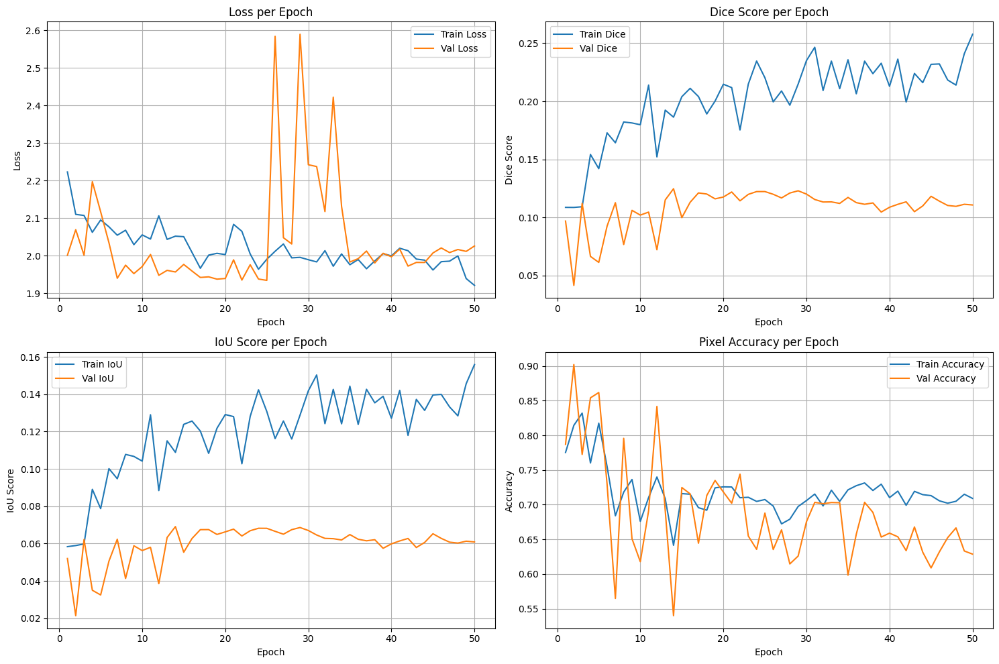

Training metrics plot saved to /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update/training_metrics.png


In [ ]:
# --- Training History Initialization ---
train_losses = []
val_losses = []
train_dice_scores = []
val_dice_scores = []
train_iou_scores = []
val_iou_scores = []
train_accuracies = []
val_accuracies = []

best_val_dice = -1.0
LAST_SAVED_EPOCH = 0 # Initialize to 0 to indicate no previous models loaded

# --- IMPORTANT: FORCE FRESH START ---
# Uncomment the following line if you ABSOLUTELY want to start from scratch,
# even if older model checkpoints exist.
# If you comment this out, it will attempt to resume from the latest found checkpoint.
# LAST_SAVED_EPOCH = 0
# print("FORCING FRESH START: Training will begin from epoch 1 (overriding any existing checkpoints).")


# --- Model Loading/Resumption Logic ---
# This loop will now only execute if LAST_SAVED_EPOCH is still 0 (meaning no fresh start was forced
# or no existing models were found initially).
if LAST_SAVED_EPOCH == 0: # Only try to find models if not forced to start fresh
    MODEL_PATH_PREFIX = os.path.join(model_weights_dir, 'unet_custom_epoch_')
    found_model_to_resume = False
    for i in range(50, 0, -1): # Check for epochs from 50 down to 1
        potential_path = f"{MODEL_PATH_PREFIX}{i:02d}.pth"
        if os.path.exists(potential_path):
            try:
                model.load_state_dict(torch.load(potential_path, map_location=device))
                LAST_SAVED_EPOCH = i
                print(f"Resuming training from model: {potential_path}")
                found_model_to_resume = True

                # Load previous training history if available and matching
                HISTORY_CSV_PATH = os.path.join(model_weights_dir, 'training_history.csv')
                if os.path.exists(HISTORY_CSV_PATH):
                    history_df = pd.read_csv(HISTORY_CSV_PATH)
                    if len(history_df) >= LAST_SAVED_EPOCH:
                        # Slice history lists to match the loaded epoch
                        train_losses = history_df['train_loss'].tolist()[:LAST_SAVED_EPOCH]
                        val_losses = history_df['val_loss'].tolist()[:LAST_SAVED_EPOCH]
                        train_dice_scores = history_df['train_dice'].tolist()[:LAST_SAVED_EPOCH]
                        val_dice_scores = history_df['val_dice'].tolist()[:LAST_SAVED_EPOCH]
                        train_iou_scores = history_df['train_iou'].tolist()[:LAST_SAVED_EPOCH]
                        val_iou_scores = history_df['val_iou'].tolist()[:LAST_SAVED_EPOCH]
                        train_accuracies = history_df['train_accuracy'].tolist()[:LAST_SAVED_EPOCH]
                        val_accuracies = history_df['val_accuracy'].tolist()[:LAST_SAVED_EPOCH]
                        print(f"Loaded training history up to epoch {LAST_SAVED_EPOCH}.")
                        # Update best_val_dice if resuming
                        if val_dice_scores:
                            best_val_dice = max(val_dice_scores)
                            print(f"Updated best_val_dice to {best_val_dice:.4f} from loaded history.")
                    else:
                        print("History CSV found but does not match loaded epoch. Starting history anew.")
                else:
                    print("No previous training history CSV found. Starting new metric tracking.")
                break # Exit loop once model is loaded
            except Exception as e:
                print(f"Error loading model from {potential_path}: {e}. Trying previous epoch...")

    if not found_model_to_resume:
        print("No existing model weights found. Starting training from scratch.")
else:
    print("Forced fresh start. Training will begin from epoch 1.")


START_EPOCH_TRAINING = LAST_SAVED_EPOCH # Start from the epoch *after* the last saved one
NUM_EPOCHS = 50 # Let's increase this for more training with scheduler and augmentation

print(f"\n--- Training from epoch {START_EPOCH_TRAINING + 1} to {NUM_EPOCHS} ---")

# --- Main Training Loop ---
for epoch in range(START_EPOCH_TRAINING, NUM_EPOCHS):
    current_epoch_num = epoch + 1 # Use 1-based indexing for display

    # Training Phase
    model.train() # Set model to training mode
    running_loss = 0.0
    train_dice_total = 0.0
    train_iou_total = 0.0
    train_acc_total = 0.0
    processed_train_batches = 0

    pbar_train = tqdm(train_loader, desc=f"Epoch {current_epoch_num}/{NUM_EPOCHS} (Train)")
    for images, masks in pbar_train:
        images, masks = images.to(device), masks.to(device)

        # DEBUGGING: Check for NaNs/Infs in inputs *before* model call
        if torch.isnan(images).any() or torch.isinf(images).any():
            print(f"\n!!! DEBUG: NaN/Inf detected in 'images' INPUT at epoch {current_epoch_num}, batch {pbar_train.n}. Skipping batch.")
            print(f"    Image stats (before model): min={images.min().item()}, max={images.max().item()}, mean={images.mean().item()}, std={images.std().item()}")
            continue # Skip this batch if inputs are bad
        if torch.isnan(masks).any() or torch.isinf(masks).any():
            print(f"\n!!! DEBUG: NaN/Inf detected in 'masks' INPUT at epoch {current_epoch_num}, batch {pbar_train.n}. Skipping batch.")
            print(f"    Mask stats (before model): min={masks.min().item()}, max={masks.max().item()}, mean={masks.mean().item()}, std={masks.std().item()}")
            continue # Skip this batch if masks are bad

        optimizer.zero_grad() # Clear previous gradients
        outputs = model(images) # Forward pass

        # DEBUGGING: Check for NaNs/Infs in outputs *after* model call
        if torch.isnan(outputs).any() or torch.isinf(outputs).any():
            print(f"\n!!! CRITICAL DEBUG: NaN/Inf detected in 'outputs' AFTER model call at epoch {current_epoch_num}, batch {pbar_train.n}.")
            print(f"    Outputs stats (raw logits): min={outputs.min().item() if not torch.isnan(outputs).any() else 'NaN'}, max={outputs.max().item() if not torch.isnan(outputs).any() else 'NaN'}, mean={outputs.mean().item() if not torch.isnan(outputs).any() else 'NaN'}, std={outputs.std().item() if not torch.isnan(outputs).any() else 'NaN'}")
            print(f"    Input image stats that caused this: min={images.min().item()}, max={images.max().item()}, mean={images.mean().item()}, std={images.std().item()}")
            continue # Skip this batch if outputs are bad

        loss = criterion(outputs, masks) # Calculate loss

        # DEBUGGING: Check for NaN/Inf in loss
        if torch.isnan(loss).any() or torch.isinf(loss).any():
            print(f"\n!!! DEBUG: NaN/Inf detected in 'loss' at epoch {current_epoch_num}, batch {pbar_train.n}.")
            print(f"    Loss value: {loss.item() if not torch.isnan(loss).any() else 'NaN'}")
            print(f"    Outputs (after sigmoid) min: {torch.sigmoid(outputs).min().item()}, max: {torch.sigmoid(outputs).max().item()}")
            print(f"    Masks min: {masks.min().item()}, max: {masks.max().item()}")
            continue # Skip this batch if loss is bad

        loss.backward() # Backpropagation
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=0.1) # Gradient clipping
        optimizer.step() # Update model weights
        running_loss += loss.item()

        # Calculate metrics for the current batch
        current_dice = dice_coeff(outputs, masks)
        current_iou = iou_score(outputs, masks)
        current_acc = pixel_accuracy(outputs, masks)

        train_dice_total += current_dice
        train_iou_total += current_iou
        train_acc_total += current_acc
        processed_train_batches += 1

        # Update tqdm progress bar with current batch metrics
        pbar_train.set_postfix(loss=loss.item(), dice=current_dice, iou=current_iou, acc=current_acc)

    # Calculate average training metrics for the epoch
    avg_train_loss = running_loss / processed_train_batches if processed_train_batches > 0 else float('nan')
    avg_train_dice = train_dice_total / processed_train_batches if processed_train_batches > 0 else float('nan')
    avg_train_iou = train_iou_total / processed_train_batches if processed_train_batches > 0 else float('nan')
    avg_train_acc = train_acc_total / processed_train_batches if processed_train_batches > 0 else float('nan')

    # Store epoch-level training metrics
    train_losses.append(avg_train_loss)
    train_dice_scores.append(avg_train_dice)
    train_iou_scores.append(avg_train_iou)
    train_accuracies.append(avg_train_acc)

    # Validation Phase
    model.eval() # Set model to evaluation mode
    val_loss = 0.0
    val_dice_total = 0.0
    val_iou_total = 0.0
    val_acc_total = 0.0
    processed_val_batches = 0

    pbar_val = tqdm(val_loader, desc=f"Epoch {current_epoch_num}/{NUM_EPOCHS} (Val)")
    with torch.no_grad(): # Disable gradient calculations for validation
        for images, masks in pbar_val:
            images, masks = images.to(device), masks.to(device)

            # DEBUGGING: Check for NaNs/Infs in VAL inputs
            if torch.isnan(images).any() or torch.isinf(images).any():
                print(f"\n!!! DEBUG: NaN/Inf detected in VAL 'images' INPUT at epoch {current_epoch_num}, batch {pbar_val.n}. Skipping batch.")
                print(f"    Image stats (before model): min={images.min().item()}, max={images.max().item()}, mean={images.mean().item()}, std={images.std().item()}")
                continue
            if torch.isnan(masks).any() or torch.isinf(masks).any():
                print(f"\n!!! DEBUG: NaN/Inf detected in VAL 'masks' INPUT at epoch {current_epoch_num}, batch {pbar_val.n}. Skipping batch.")
                print(f"    Mask stats (before model): min={masks.min().item()}, max={masks.max().item()}, mean={masks.mean().item()}, std={masks.std().item()}")
                continue

            outputs = model(images)

            # DEBUGGING: Check for NaNs/Infs in VAL outputs
            if torch.isnan(outputs).any() or torch.isinf(outputs).any():
                print(f"\n!!! CRITICAL DEBUG: NaN/Inf detected in VAL 'outputs' AFTER model call at epoch {current_epoch_num}, batch {pbar_val.n}.")
                print(f"    Outputs stats (raw logits): min={outputs.min().item() if not torch.isnan(outputs).any() else 'NaN'}, max={outputs.max().item() if not torch.isnan(outputs).any() else 'NaN'}, mean={outputs.mean().item() if not torch.isnan(outputs).any() else 'NaN'}, std={outputs.std().item() if not torch.isnan(outputs).any() else 'NaN'}")
                print(f"    Input image stats that caused this: min={images.min().item()}, max={images.max().item()}, mean={images.mean().item()}, std={images.std().item()}") # Fix: Used mean twice, should be std
                continue

            loss = criterion(outputs, masks)

            # DEBUGGING: Check for NaN/Inf in VAL loss
            if torch.isnan(loss).any() or torch.isinf(loss).any():
                print(f"\n!!! DEBUG: NaN/Inf detected in VAL 'loss' at epoch {current_epoch_num}, batch {pbar_val.n}.")
                print(f"    Loss value: {loss.item() if not torch.isnan(loss).any() else 'NaN'}")
                print(f"    Outputs (after sigmoid) min: {torch.sigmoid(outputs).min().item()}, max: {torch.sigmoid(outputs).max().item()}")
                print(f"    Masks min: {masks.min().item()}, max: {masks.max().item()}")
                continue

            val_loss += loss.item()
            val_dice_total += dice_coeff(outputs, masks)
            val_iou_total += iou_score(outputs, masks)
            val_acc_total += pixel_accuracy(outputs, masks)
            processed_val_batches += 1
            pbar_val.set_postfix(loss=loss.item(), dice=dice_coeff(outputs, masks), iou=iou_score(outputs, masks), acc=pixel_accuracy(outputs, masks))


    # Calculate average validation metrics for the epoch
    avg_val_loss = val_loss / processed_val_batches if processed_val_batches > 0 else float('nan')
    avg_val_dice = val_dice_total / processed_val_batches if processed_val_batches > 0 else float('nan')
    avg_val_iou = val_iou_total / processed_val_batches if processed_val_batches > 0 else float('nan')
    avg_val_acc = val_acc_total / processed_val_batches if processed_val_batches > 0 else float('nan')

    # Store epoch-level validation metrics
    val_losses.append(avg_val_loss)
    val_dice_scores.append(avg_val_dice)
    val_iou_scores.append(avg_val_iou)
    val_accuracies.append(avg_val_acc)

    # Print epoch summary
    print(f"Epoch [{current_epoch_num}/{NUM_EPOCHS}], "
          f"Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}, "
          f"Train Dice: {avg_train_dice:.4f}, Train IoU: {avg_train_iou:.4f}, Train Acc: {avg_train_acc:.4f}, "
          f"Val Dice: {avg_val_dice:.4f}, Val IoU: {avg_val_iou:.4f}, Val Acc: {avg_val_acc:.4f}")


    #**Crucial Change: Step the learning rate scheduler**
    #This line will adjust the learning rate based on `avg_val_loss`.

    scheduler.step(avg_val_loss)

    # Save model weights for current epoch
    epoch_model_filename = os.path.join(model_weights_dir, f'unet_custom_epoch_{current_epoch_num:02d}.pth')
    torch.save(model.state_dict(), epoch_model_filename)
    print(f"Saved model to {epoch_model_filename}")

    # Save best model based on validation Dice score
    if avg_val_dice > best_val_dice:
        best_val_dice = avg_val_dice
        best_model_path = os.path.join(model_weights_dir, 'best_unet_custom_model.pth')
        torch.save(model.state_dict(), best_model_path)
        print(f"Saved best model with Val Dice: {best_val_dice:.4f}")

    # Save training history to CSV
    history_df_to_save = pd.DataFrame({
        'epoch': list(range(1, len(train_losses) + 1)),
        'train_loss': train_losses,
        'val_loss': val_losses,
        'train_dice': train_dice_scores,
        'val_dice': val_dice_scores,
        'train_iou': train_iou_scores,
        'val_iou': val_iou_scores,
        'train_accuracy': train_accuracies,
        'val_accuracy': val_accuracies
    })
    HISTORY_CSV_PATH = os.path.join(model_weights_dir, 'training_history.csv')
    history_df_to_save.to_csv(HISTORY_CSV_PATH, index=False)
    print("Training history updated and saved to training_history.csv")

print("\n--- Training Complete! ---")

# --- Plotting Training History ---
print("\n--- Plotting Training Metrics ---")
try:
    HISTORY_CSV_PATH = os.path.join(model_weights_dir, 'training_history.csv')
    history_df = pd.read_csv(HISTORY_CSV_PATH)

    plt.figure(figsize=(15, 10))

    # Plot Loss
    plt.subplot(2, 2, 1)
    plt.plot(history_df['epoch'], history_df['train_loss'], label='Train Loss')
    plt.plot(history_df['epoch'], history_df['val_loss'], label='Val Loss')
    plt.title('Loss per Epoch')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # Plot Dice Score
    plt.subplot(2, 2, 2)
    plt.plot(history_df['epoch'], history_df['train_dice'], label='Train Dice')
    plt.plot(history_df['epoch'], history_df['val_dice'], label='Val Dice')
    plt.title('Dice Score per Epoch')
    plt.xlabel('Epoch')
    plt.ylabel('Dice Score')
    plt.legend()
    plt.grid(True)

    # Plot IoU Score
    plt.subplot(2, 2, 3)
    plt.plot(history_df['epoch'], history_df['train_iou'], label='Train IoU')
    plt.plot(history_df['epoch'], history_df['val_iou'], label='Val IoU')
    plt.title('IoU Score per Epoch')
    plt.xlabel('Epoch')
    plt.ylabel('IoU Score')
    plt.legend()
    plt.grid(True)

    # Plot Accuracy
    plt.subplot(2, 2, 4)
    plt.plot(history_df['epoch'], history_df['train_accuracy'], label='Train Accuracy')
    plt.plot(history_df['epoch'], history_df['val_accuracy'], label='Val Accuracy')
    plt.title('Pixel Accuracy per Epoch')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.savefig(os.path.join(model_weights_dir, 'training_metrics.png'))
    plt.show()
    print(f"Training metrics plot saved to {os.path.join(model_weights_dir, 'training_metrics.png')}")

except Exception as e:
    print(f"Error plotting training history: {e}")

In [ ]:
import pandas as pd
import os

# --- Define the correct path to your training history CSV ---
# Ensure model_weights_dir is defined in your environment, e.g.:
model_weights_dir = '/content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/model_weights_update'
HISTORY_CSV_PATH = os.path.join(model_weights_dir, 'training_history.csv')

if os.path.exists(HISTORY_CSV_PATH):
    # Load the training history into a Pandas DataFrame
    history_df = pd.read_csv(HISTORY_CSV_PATH)

    # Find the row with the maximum 'Val Dice'
    # .idxmax() returns the index of the first occurrence of the maximum value
    best_epoch_row = history_df.loc[history_df['val_dice'].idxmax()]

    best_epoch_num = int(best_epoch_row['epoch'])
    best_val_dice = best_epoch_row['val_dice']
    best_val_iou = best_epoch_row['val_iou']
    best_val_acc = best_epoch_row['val_accuracy']
    best_val_loss = best_epoch_row['val_loss']

    print("\n--- Best Model Identification from Training History ---")
    print(f"The **best model** (based on highest Validation Dice) was achieved at **Epoch: {best_epoch_num}**")
    print(f"  Val Dice: {best_val_dice:.4f}")
    print(f"  Val IoU: {best_val_iou:.4f}")
    print(f"  Val Acc: {best_val_acc:.4f}")
    print(f"  Val Loss: {best_val_loss:.4f}")
    print("\nThis means the `best_unet_custom_model.pth` file in your `model_weights_dir` should contain the weights from this epoch.")
else:
    print(f"Error: Training history CSV not found at {HISTORY_CSV_PATH}")
    print("Please ensure your training script saves the history and the path is correct.")


--- Best Model Identification from Training History ---
The **best model** (based on highest Validation Dice) was achieved at **Epoch: 14**
  Val Dice: 0.1247
  Val IoU: 0.0691
  Val Acc: 0.5400
  Val Loss: 1.9566

This means the `best_unet_custom_model.pth` file in your `model_weights_dir` should contain the weights from this epoch.


In [ ]:
import torch
import numpy as np
import os
import tifffile as tiff
from tqdm import tqdm # Assuming tqdm is already imported

# --- Paths (Ensure these match your training script's paths) ---
# Assuming base_path, model_weights_dir, device are already defined in your notebook
# Example:
# base_path = '/content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled'
# model_weights_dir = os.path.join(base_path, 'model_weights_update') # Or whatever your actual save directory is
# images_dir = os.path.join(base_path, 'S1Hand') # Original SAR images directory for display
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# --- Model Loading and Prediction Generation ---
# This part assumes your model, test_loader, test_subset_final, full_dataset_raw
# and BATCH_SIZE are already defined and in scope from your training setup.

print("\n--- Generating Predictions on Test Set for Visualization ---")

# Define where to save the predicted masks
predicted_masks_output_dir = os.path.join(base_path, 'predicted_masks_test_set_final_epoch') # Use a distinct name for final predictions
os.makedirs(predicted_masks_output_dir, exist_ok=True)

# Load the BEST model saved during training
# IMPORTANT: Ensure the filename matches what you saved (e.g., 'best_unet_custom_model.pth')
model_path = os.path.join(model_weights_dir, 'best_unet_custom_model.pth')

if not os.path.exists(model_path):
    print(f"Error: Model weights not found at {model_path}. Please ensure training completed and best model was saved.")
else:
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.eval() # Set model to evaluation mode

    test_original_indices = test_subset_final.indices # Get original indices from the test_subset_final

    with torch.no_grad():
        for i, (images, _) in enumerate(tqdm(test_loader, desc="Predicting on test set")):
            images = images.to(device)
            outputs = model(images)
            predictions = torch.sigmoid(outputs) # Convert logits to probabilities
            predicted_binary_masks = (predictions > 0.5).float() # Binarize

            for j in range(images.shape[0]): # Iterate through the batch
                # Get the original dataset index for the current sample in the batch
                original_idx_in_full_dataset = test_original_indices[i * BATCH_SIZE + j]

                # Use the base name from the full_dataset_raw to ensure correct file naming
                # full_dataset_raw was used for indexing and base names
                base_name = full_dataset_raw.common_base_names[original_idx_in_full_dataset]

                predicted_mask_filename = os.path.join(predicted_masks_output_dir, f'{base_name}_predicted_mask.tif')

                # Save the mask as a TIFF file (squeeze to remove channel dim if 1, convert to uint8)
                # Ensure it's CPU tensor and then NumPy array
                tiff.imwrite(predicted_mask_filename, predicted_binary_masks[j].cpu().squeeze().numpy().astype(np.uint8))

    print(f"All {len(test_subset_final)} predicted masks for the test set saved to: {predicted_masks_output_dir}")


--- Generating Predictions on Test Set for Visualization ---


Predicting on test set: 100%|██████████| 12/12 [00:05<00:00,  2.16it/s]

All 90 predicted masks for the test set saved to: /content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/predicted_masks_test_set_final_epoch


In [ ]:
import torch
from tqdm import tqdm

# Ensure your metrics functions (dice_coeff, iou_score, pixel_accuracy) are defined
# and that your model is loaded (e.g., the best_unet_custom_model.pth).
# Also ensure test_loader and device are in scope.

print("\n--- Evaluating Overall Model Performance on Test Set ---")

# Load the best model for final evaluation
model_path = os.path.join(model_weights_dir, 'best_unet_custom_model.pth')

if not os.path.exists(model_path):
    print(f"Error: Best model weights not found at {model_path}. Cannot perform final evaluation.")
else:
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.eval() # Set model to evaluation mode

    total_test_loss = 0.0 # Will not be calculated unless criterion is defined and used
    total_test_dice = 0.0
    total_test_iou = 0.0
    total_test_acc = 0.0
    num_batches = 0

    with torch.no_grad():
        for images, masks in tqdm(test_loader, desc="Evaluating on test set"):
            images = images.to(device)
            masks = masks.to(device)

            outputs = model(images)

            # Calculate metrics
            total_test_dice += dice_coeff(outputs, masks)
            total_test_iou += iou_score(outputs, masks)
            total_test_acc += pixel_accuracy(outputs, masks)
            num_batches += 1

    if num_batches > 0:
        avg_test_dice = total_test_dice / num_batches
        avg_test_iou = total_test_iou / num_batches
        avg_test_acc = total_test_acc / num_batches

        print("\n--- Overall Test Set Performance ---")
        print(f"Average Test Dice Coefficient: {avg_test_dice:.4f}")
        print(f"Average Test IoU Score: {avg_test_iou:.4f}")
        print(f"Average Test Pixel Accuracy: {avg_test_acc:.4f}")
    else:
        print("No batches processed in the test set. Check your test_loader.")


--- Evaluating Overall Model Performance on Test Set ---


Evaluating on test set: 100%|██████████| 12/12 [00:02<00:00,  4.85it/s]


--- Overall Test Set Performance ---
Average Test Dice Coefficient: 0.1605
Average Test IoU Score: 0.0939
Average Test Pixel Accuracy: 0.5771


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import tifffile as tiff
# tqdm is already imported

# --- Example Usage (after your 50-epoch training and prediction generation) ---
# These paths should point to your original SAR images and the newly generated predicted masks
sar_images_for_display_dir = images_dir # This points to your actual SAR images directory
predicted_masks_for_display_dir = predicted_masks_output_dir # This points to the directory created above



# Re-define visualize_test_set_results if it's not in the same cell scope:
def visualize_test_set_results(sar_images_dir, predicted_masks_dir, num_images_to_show=5):
    """
    Displays the original SAR image, its predicted binary mask, and the flood overlay
    for selected images from the test set.

    Args:
        sar_images_dir (str): Directory containing the original SAR image TIFF files.
        predicted_masks_dir (str): Directory containing the predicted flood mask TIFF files.
        num_images_to_show (int): Number of images to display. Set to None to display all.
    """

    # Get all matching base names
    image_filenames = sorted([f for f in os.listdir(sar_images_dir) if f.endswith('.tif')])
    mask_filenames = sorted([f for f in os.listdir(predicted_masks_dir) if f.endswith('.tif')])

    base_names_image = {f.replace('_S1Hand.tif', '') for f in image_filenames}
    base_names_predicted_mask = {f.replace('_predicted_mask.tif', '') for f in mask_filenames}

    common_base_names = sorted(list(base_names_image.intersection(base_names_predicted_mask)))

    if not common_base_names:
        print("No matching SAR image and predicted mask pairs found for visualization.")
        return

    # Shuffle for random selection if showing less than all
    if num_images_to_show is not None and num_images_to_show < len(common_base_names):
        selected_base_names = np.random.choice(common_base_names, num_images_to_show, replace=False)
    else:
        selected_base_names = common_base_names # Show all

    print(f"\n--- Displaying {len(selected_base_names)} Sample Test Set Visualizations ---")

    for i, base_name in enumerate(selected_base_names):
        current_sar_path = os.path.join(sar_images_dir, f'{base_name}_S1Hand.tif')
        current_mask_path = os.path.join(predicted_masks_dir, f'{base_name}_predicted_mask.tif')

        try:
            # 1. Load the SAR image
            sar_image = tiff.imread(current_sar_path)

            if sar_image.ndim == 3 and sar_image.shape[0] == 2:
                sar_image_display = np.mean(sar_image, axis=0)
            elif sar_image.ndim == 2:
                sar_image_display = sar_image
            else:
                print(f"WARNING: Unexpected SAR image shape for {current_sar_path}: {sar_image.shape}. Skipping.")
                continue

            p_low, p_high = np.percentile(sar_image_display, (2, 98))
            sar_image_display = np.clip(sar_image_display, p_low, p_high)
            sar_image_norm_display = cv2.normalize(sar_image_display, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)
            sar_image_color = cv2.cvtColor(sar_image_norm_display, cv2.COLOR_GRAY2BGR)

            # 2. Load the predicted flood mask
            predicted_mask = tiff.imread(current_mask_path)
            predicted_mask = (predicted_mask > 0).astype(np.uint8)

            if predicted_mask.shape[0] != sar_image_color.shape[0] or predicted_mask.shape[1] != sar_image_color.shape[1]:
                predicted_mask_resized = cv2.resize(predicted_mask, (sar_image_color.shape[1], sar_image_color.shape[0]), interpolation=cv2.INTER_NEAREST)
            else:
                predicted_mask_resized = predicted_mask

            # 3. Create the red overlay for flood visualization
            red_overlay = np.zeros_like(sar_image_color)
            red_overlay[:, :, 2] = 255

            masked_region = cv2.bitwise_and(red_overlay, red_overlay, mask=predicted_mask_resized)
            combined_image_overlay = cv2.addWeighted(sar_image_color, 1, masked_region, 0.5, 0)

            # 4. Calculate percentage of flooded pixels
            flood_percentage = (np.sum(predicted_mask_resized) / predicted_mask_resized.size) * 100

            # 5. Add text to the overlay image
            font = cv2.FONT_HERSHEY_SIMPLEX
            text_overlay = f"Flooded Area: {flood_percentage:.2f}%"
            cv2.putText(combined_image_overlay, text_overlay, (10, 30), font, 0.7, (255, 255, 255), 2, cv2.LINE_AA)

            # --- Plotting in Subplots ---
            fig, axes = plt.subplots(1, 3, figsize=(18, 6))

            axes[0].imshow(sar_image_norm_display, cmap='gray')
            axes[0].set_title(f"Original SAR Image: {base_name}")
            axes[0].axis('off')

            axes[1].imshow(predicted_mask_resized, cmap='binary', vmin=0, vmax=1)
            axes[1].set_title(f"Predicted Binary Mask (0=No Flood, 1=Flood)")
            axes[1].axis('off')

            axes[2].imshow(cv2.cvtColor(combined_image_overlay, cv2.COLOR_BGR2RGB))
            axes[2].set_title(f"SAR with Flood Overlay (Red)")
            axes[2].axis('off')

            plt.tight_layout()
            plt.show()

        except Exception as e:
            print(f"Error processing {current_sar_path} and {current_mask_path}: {e}")


--- Displaying 5 Sample Test Set Visualizations ---


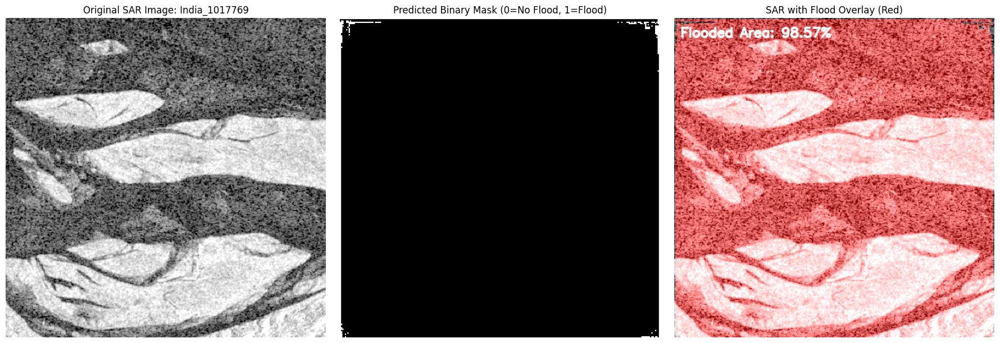

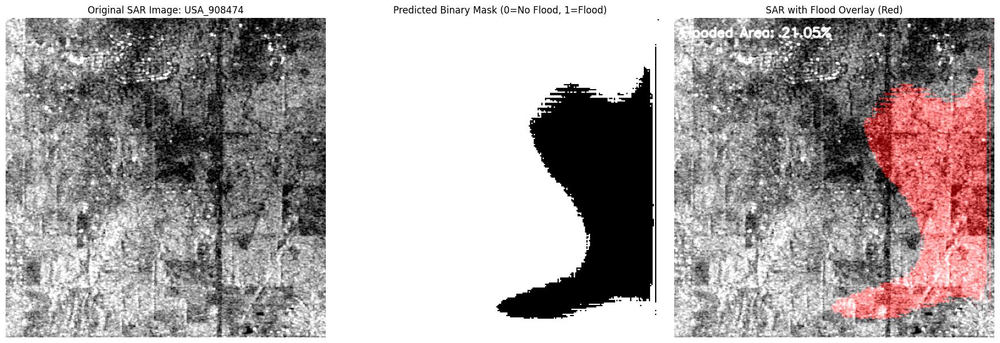

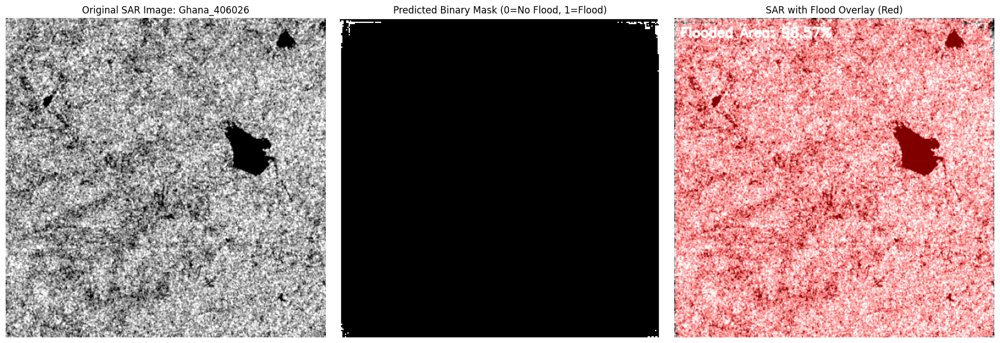

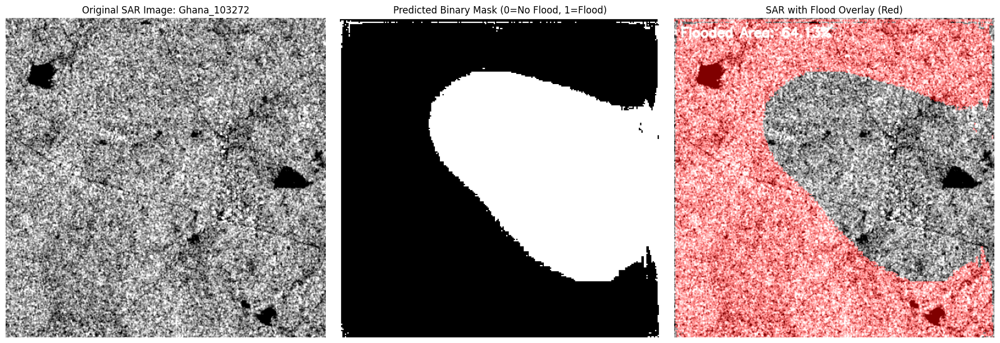

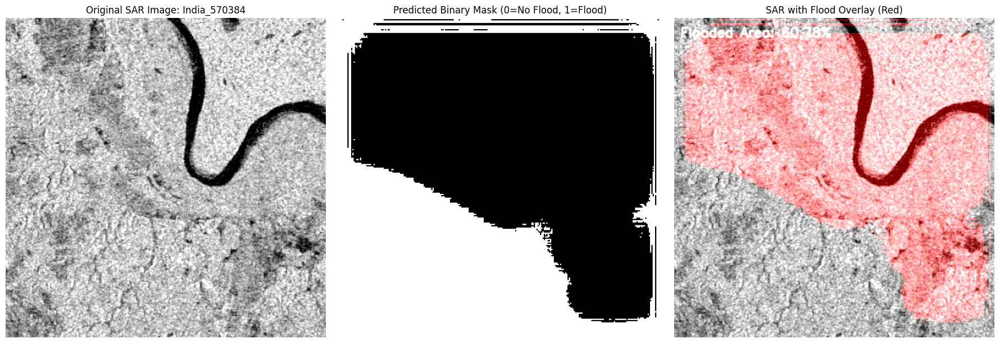

In [ ]:
# Call the visualization function to display a few sample images
visualize_test_set_results(sar_images_for_display_dir, predicted_masks_for_display_dir, num_images_to_show=5)


--- Displaying 5 Sample Test Set Visualizations ---

--- Debugging Mask for Spain_6537196 ---
Predicted mask shape: (512, 512)
Predicted mask data type: uint8
Unique values in predicted mask: [0 1]
  Value 0: 261504 pixels (99.76%)
  Value 1: 640 pixels (0.24%)
Top-left 5x5 corner of mask:
[[0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]]


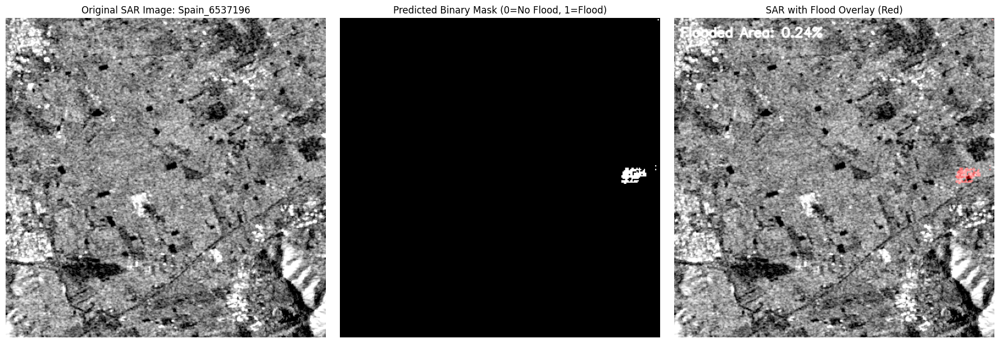


--- Debugging Mask for Pakistan_528249 ---
Predicted mask shape: (512, 512)
Predicted mask data type: uint8
Unique values in predicted mask: [0 1]
  Value 0: 3900 pixels (1.49%)
  Value 1: 258244 pixels (98.51%)
Top-left 5x5 corner of mask:
[[0 0 0 0 0]
 [0 0 0 0 0]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 0 0 0]]


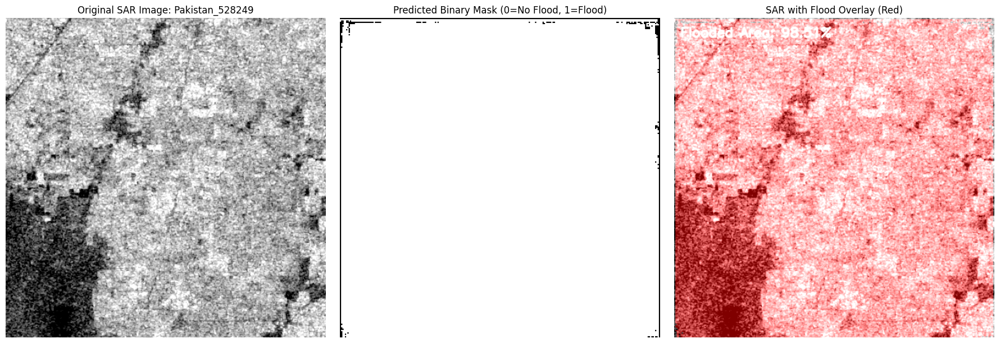


--- Debugging Mask for USA_260929 ---
Predicted mask shape: (512, 512)
Predicted mask data type: uint8
Unique values in predicted mask: [0 1]
  Value 0: 3868 pixels (1.48%)
  Value 1: 258276 pixels (98.52%)
Top-left 5x5 corner of mask:
[[0 0 0 0 0]
 [0 0 0 0 0]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 0 0 0]]


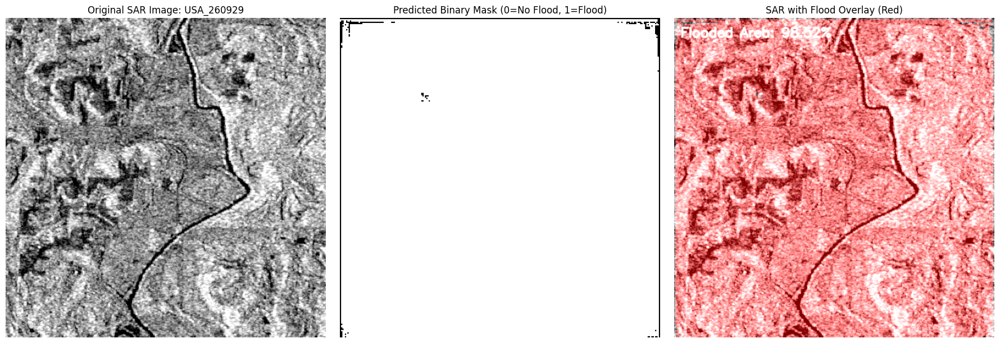


--- Debugging Mask for USA_595451 ---
Predicted mask shape: (512, 512)
Predicted mask data type: uint8
Unique values in predicted mask: [0 1]
  Value 0: 21164 pixels (8.07%)
  Value 1: 240980 pixels (91.93%)
Top-left 5x5 corner of mask:
[[0 0 0 0 0]
 [0 0 0 0 0]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 0 0 0]]


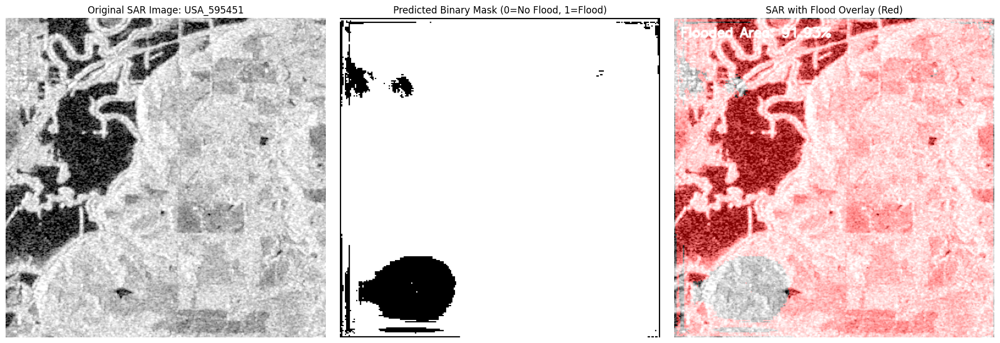


--- Debugging Mask for India_624341 ---
Predicted mask shape: (512, 512)
Predicted mask data type: uint8
Unique values in predicted mask: [0 1]
  Value 0: 260812 pixels (99.49%)
  Value 1: 1332 pixels (0.51%)
Top-left 5x5 corner of mask:
[[0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]]


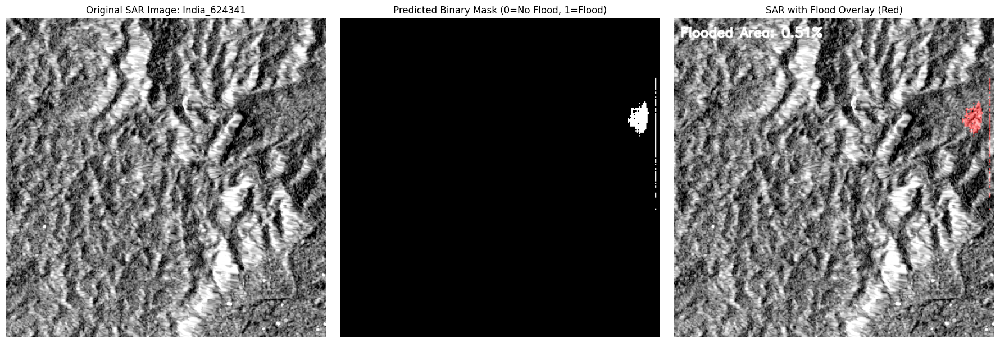

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import tifffile as tiff
from tqdm import tqdm # Import tqdm for progress bar during prediction generation

# --- Modified Visualization Function ---

def visualize_test_set_results(sar_images_dir, predicted_masks_dir, num_images_to_show=5):
    """
    Displays the original SAR image, its predicted binary mask, and the flood overlay
    for selected images from the test set.

    Args:
        sar_images_dir (str): Directory containing the original SAR image TIFF files.
        predicted_masks_dir (str): Directory containing the predicted flood mask TIFF files.
        num_images_to_show (int): Number of images to display. Set to None to display all.
    """

    # Get all matching base names
    image_filenames = sorted([f for f in os.listdir(sar_images_dir) if f.endswith('.tif')])
    mask_filenames = sorted([f for f in os.listdir(predicted_masks_dir) if f.endswith('.tif')])

    base_names_image = {f.replace('_S1Hand.tif', '') for f in image_filenames}
    base_names_predicted_mask = {f.replace('_predicted_mask.tif', '') for f in mask_filenames}

    common_base_names = sorted(list(base_names_image.intersection(base_names_predicted_mask)))

    if not common_base_names:
        print("No matching SAR image and predicted mask pairs found for visualization.")
        return

    # Shuffle for random selection if showing less than all
    if num_images_to_show is not None and num_images_to_show < len(common_base_names):
        selected_base_names = np.random.choice(common_base_names, num_images_to_show, replace=False)
    else:
        selected_base_names = common_base_names # Show all

    print(f"\n--- Displaying {len(selected_base_names)} Sample Test Set Visualizations ---")

    for i, base_name in enumerate(selected_base_names):
        current_sar_path = os.path.join(sar_images_dir, f'{base_name}_S1Hand.tif')
        current_mask_path = os.path.join(predicted_masks_dir, f'{base_name}_predicted_mask.tif')

        try:
            # 1. Load the SAR image
            sar_image = tiff.imread(current_sar_path)

            if sar_image.ndim == 3 and sar_image.shape[0] == 2:
                sar_image_display = np.mean(sar_image, axis=0)
            elif sar_image.ndim == 2:
                sar_image_display = sar_image
            else:
                print(f"WARNING: Unexpected SAR image shape for {current_sar_path}: {sar_image.shape}. Skipping.")
                continue

            p_low, p_high = np.percentile(sar_image_display, (2, 98))
            sar_image_display = np.clip(sar_image_display, p_low, p_high)
            sar_image_norm_display = cv2.normalize(sar_image_display, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)
            sar_image_color = cv2.cvtColor(sar_image_norm_display, cv2.COLOR_GRAY2BGR)

            # 2. Load the predicted flood mask
            predicted_mask = tiff.imread(current_mask_path)
            predicted_mask = (predicted_mask > 0).astype(np.uint8) # Ensure binary (0 or 1)

            # Resize mask to match SAR image dimensions (should be 256x256, but a check is good)
            if predicted_mask.shape[0] != sar_image_color.shape[0] or predicted_mask.shape[1] != sar_image_color.shape[1]:
                predicted_mask_resized = cv2.resize(predicted_mask, (sar_image_color.shape[1], sar_image_color.shape[0]), interpolation=cv2.INTER_NEAREST)
            else:
                predicted_mask_resized = predicted_mask # No resize needed if already same size

            # --- VERIFICATION PRINTS FOR DEBUGGING ---
            print(f"\n--- Debugging Mask for {base_name} ---")
            print(f"Predicted mask shape: {predicted_mask_resized.shape}")
            print(f"Predicted mask data type: {predicted_mask_resized.dtype}")
            unique_values = np.unique(predicted_mask_resized)
            print(f"Unique values in predicted mask: {unique_values}")
            if len(unique_values) <= 2:
                for val in unique_values:
                    count = np.sum(predicted_mask_resized == val)
                    print(f"  Value {val}: {count} pixels ({count / predicted_mask_resized.size * 100:.2f}%)")
            print(f"Top-left 5x5 corner of mask:\n{predicted_mask_resized[:5, :5]}")
            # --- END VERIFICATION PRINTS ---

            # 3. Create the red overlay for flood visualization
            red_overlay = np.zeros_like(sar_image_color)
            red_overlay[:, :, 2] = 255 # Set red channel to 255 (BGR format for OpenCV)

            # Apply the red overlay only where the mask is 1
            masked_region = cv2.bitwise_and(red_overlay, red_overlay, mask=predicted_mask_resized)

            # Blend the original SAR image with the red masked region
            combined_image_overlay = cv2.addWeighted(sar_image_color, 1, masked_region, 0.5, 0)

            # 4. Calculate percentage of flooded pixels
            flood_percentage = (np.sum(predicted_mask_resized) / predicted_mask_resized.size) * 100

            # 5. Add text to the overlay image
            font = cv2.FONT_HERSHEY_SIMPLEX
            text_overlay = f"Flooded Area: {flood_percentage:.2f}%"
            cv2.putText(combined_image_overlay, text_overlay, (10, 30), font, 0.7, (255, 255, 255), 2, cv2.LINE_AA)

            # --- Plotting in Subplots ---
            fig, axes = plt.subplots(1, 3, figsize=(18, 6))

            # Plot 1: Original SAR Image (Grayscale)
            axes[0].imshow(sar_image_norm_display, cmap='gray')
            axes[0].set_title(f"Original SAR Image: {base_name}")
            axes[0].axis('off')

            # Plot 2: Predicted Binary Mask - using 'gray' cmap
            # For 0=Black, 1=White, 'gray' cmap with vmin=0, vmax=1 is correct.
            # If your overlay is red for flood, and flood is 1, then the binary mask should show 1 (white) for flood.
            axes[1].imshow(predicted_mask_resized, cmap='gray', vmin=0, vmax=1)
            axes[1].set_title(f"Predicted Binary Mask (0=No Flood, 1=Flood)")
            axes[1].axis('off')

            # Plot 3: SAR with Flood Overlay
            axes[2].imshow(cv2.cvtColor(combined_image_overlay, cv2.COLOR_BGR2RGB))
            axes[2].set_title(f"SAR with Flood Overlay (Red)")
            axes[2].axis('off')

            plt.tight_layout()
            plt.show()

        except Exception as e:
            print(f"Error processing {current_sar_path} and {current_mask_path}: {e}")

# --- Example Usage (after your 50-epoch training and prediction generation) ---
# Ensure these paths are correctly defined in your environment
# Example:
# sar_images_for_display_dir = '/content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/S1Hand'
# predicted_masks_for_display_dir = '/content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/predicted_masks_test_set_final_epoch' # Or whatever you named it

visualize_test_set_results(sar_images_for_display_dir, predicted_masks_for_display_dir, num_images_to_show=5)


--- Displaying 5 Sample Test Set Visualizations ---

--- Debugging Mask for USA_67102 ---
Predicted mask shape: (512, 512)
Predicted mask data type: uint8
Unique values in predicted mask: [0 1]
  Value 0: 79072 pixels (30.16%)
  Value 1: 183072 pixels (69.84%)
Top-left 5x5 corner of mask:
[[0 0 0 0 0]
 [0 0 0 0 0]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 0 0 0]]


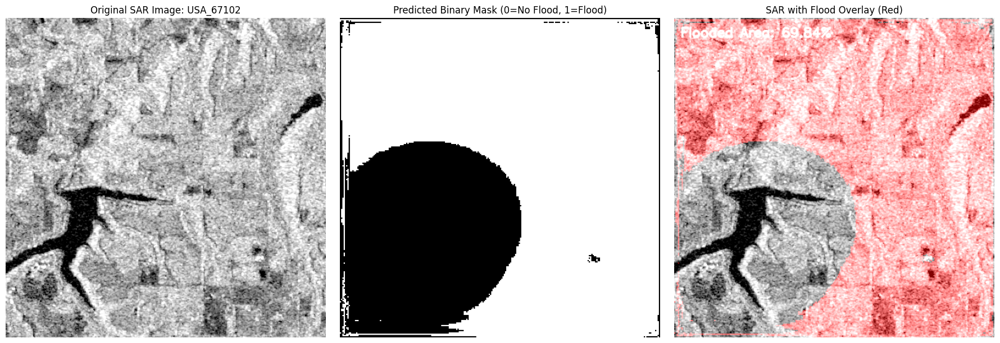


--- Debugging Mask for Paraguay_284928 ---
Predicted mask shape: (512, 512)
Predicted mask data type: uint8
Unique values in predicted mask: [0 1]
  Value 0: 258104 pixels (98.46%)
  Value 1: 4040 pixels (1.54%)
Top-left 5x5 corner of mask:
[[0 0 0 0 0]
 [0 0 0 0 0]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [0 0 0 0 0]]


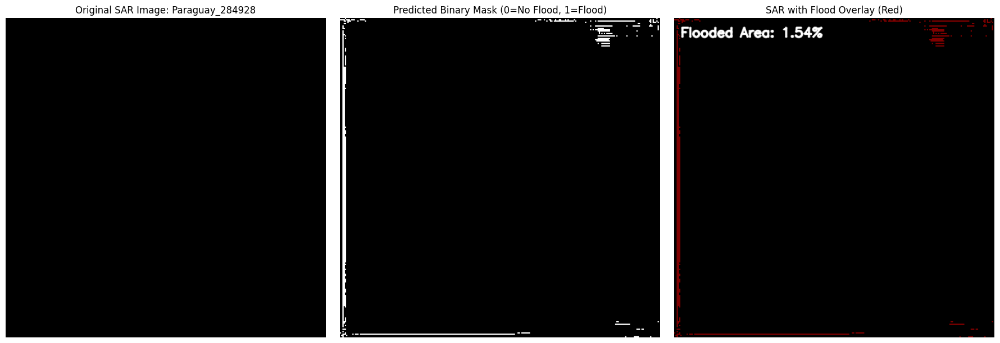


--- Debugging Mask for Somalia_61368 ---
Predicted mask shape: (512, 512)
Predicted mask data type: uint8
Unique values in predicted mask: [0 1]
  Value 0: 258104 pixels (98.46%)
  Value 1: 4040 pixels (1.54%)
Top-left 5x5 corner of mask:
[[0 0 0 0 0]
 [0 0 0 0 0]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [0 0 0 0 0]]


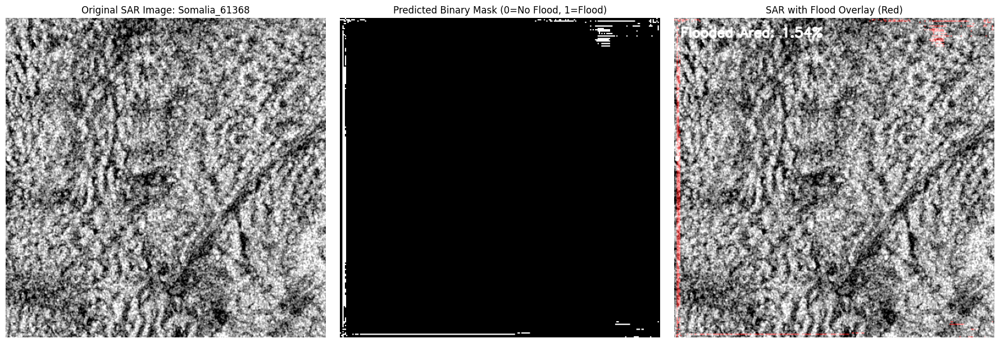


--- Debugging Mask for Bolivia_103757 ---
Predicted mask shape: (512, 512)
Predicted mask data type: uint8
Unique values in predicted mask: [0 1]
  Value 0: 258104 pixels (98.46%)
  Value 1: 4040 pixels (1.54%)
Top-left 5x5 corner of mask:
[[0 0 0 0 0]
 [0 0 0 0 0]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [0 0 0 0 0]]


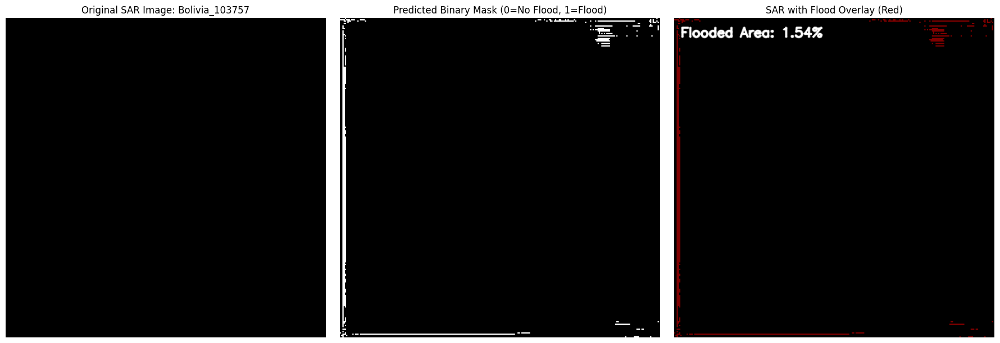


--- Debugging Mask for India_774689 ---
Predicted mask shape: (512, 512)
Predicted mask data type: uint8
Unique values in predicted mask: [0 1]
  Value 0: 262140 pixels (100.00%)
  Value 1: 4 pixels (0.00%)
Top-left 5x5 corner of mask:
[[0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]]


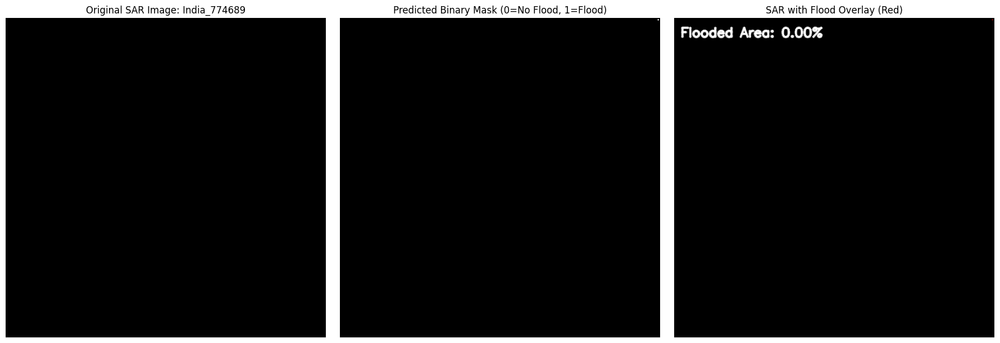

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import tifffile as tiff
from tqdm import tqdm # Import tqdm for progress bar during prediction generation

# --- Modified Visualization Function ---

def visualize_test_set_results(sar_images_dir, predicted_masks_dir, num_images_to_show=5):
    """
    Displays the original SAR image, its predicted binary mask, and the flood overlay
    for selected images from the test set.

    Args:
        sar_images_dir (str): Directory containing the original SAR image TIFF files.
        predicted_masks_dir (str): Directory containing the predicted flood mask TIFF files.
        num_images_to_show (int): Number of images to display. Set to None to display all.
    """

    # Get all matching base names
    image_filenames = sorted([f for f in os.listdir(sar_images_dir) if f.endswith('.tif')])
    mask_filenames = sorted([f for f in os.listdir(predicted_masks_dir) if f.endswith('.tif')])

    base_names_image = {f.replace('_S1Hand.tif', '') for f in image_filenames}
    base_names_predicted_mask = {f.replace('_predicted_mask.tif', '') for f in mask_filenames}

    common_base_names = sorted(list(base_names_image.intersection(base_names_predicted_mask)))

    if not common_base_names:
        print("No matching SAR image and predicted mask pairs found for visualization.")
        return

    # Shuffle for random selection if showing less than all
    if num_images_to_show is not None and num_images_to_show < len(common_base_names):
        selected_base_names = np.random.choice(common_base_names, num_images_to_show, replace=False)
    else:
        selected_base_names = common_base_names # Show all

    print(f"\n--- Displaying {len(selected_base_names)} Sample Test Set Visualizations ---")

    for i, base_name in enumerate(selected_base_names):
        current_sar_path = os.path.join(sar_images_dir, f'{base_name}_S1Hand.tif')
        current_mask_path = os.path.join(predicted_masks_dir, f'{base_name}_predicted_mask.tif')

        try:
            # 1. Load the SAR image
            sar_image = tiff.imread(current_sar_path)

            if sar_image.ndim == 3 and sar_image.shape[0] == 2:
                sar_image_display = np.mean(sar_image, axis=0)
            elif sar_image.ndim == 2:
                sar_image_display = sar_image
            else:
                print(f"WARNING: Unexpected SAR image shape for {current_sar_path}: {sar_image.shape}. Skipping.")
                continue

            p_low, p_high = np.percentile(sar_image_display, (2, 98))
            sar_image_display = np.clip(sar_image_display, p_low, p_high)
            sar_image_norm_display = cv2.normalize(sar_image_display, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)
            sar_image_color = cv2.cvtColor(sar_image_norm_display, cv2.COLOR_GRAY2BGR)

            # 2. Load the predicted flood mask
            predicted_mask = tiff.imread(current_mask_path)
            predicted_mask = (predicted_mask > 0).astype(np.uint8) # Ensure binary (0 or 1)

            # Resize mask to match SAR image dimensions (should be 256x256, but a check is good)
            if predicted_mask.shape[0] != sar_image_color.shape[0] or predicted_mask.shape[1] != sar_image_color.shape[1]:
                predicted_mask_resized = cv2.resize(predicted_mask, (sar_image_color.shape[1], sar_image_color.shape[0]), interpolation=cv2.INTER_NEAREST)
            else:
                predicted_mask_resized = predicted_mask # No resize needed if already same size

            # --- VERIFICATION PRINTS FOR DEBUGGING ---
            print(f"\n--- Debugging Mask for {base_name} ---")
            print(f"Predicted mask shape: {predicted_mask_resized.shape}")
            print(f"Predicted mask data type: {predicted_mask_resized.dtype}")
            unique_values = np.unique(predicted_mask_resized)
            print(f"Unique values in predicted mask: {unique_values}")
            if len(unique_values) <= 2:
                for val in unique_values:
                    count = np.sum(predicted_mask_resized == val)
                    print(f"  Value {val}: {count} pixels ({count / predicted_mask_resized.size * 100:.2f}%)")
            print(f"Top-left 5x5 corner of mask:\n{predicted_mask_resized[:5, :5]}")
            # --- END VERIFICATION PRINTS ---

            # 3. Create the red overlay for flood visualization
            red_overlay = np.zeros_like(sar_image_color)
            red_overlay[:, :, 2] = 255 # Set red channel to 255 (BGR format for OpenCV)

            # Apply the red overlay only where the mask is 1
            masked_region = cv2.bitwise_and(red_overlay, red_overlay, mask=predicted_mask_resized)

            # Blend the original SAR image with the red masked region
            combined_image_overlay = cv2.addWeighted(sar_image_color, 1, masked_region, 0.5, 0)

            # 4. Calculate percentage of flooded pixels
            flood_percentage = (np.sum(predicted_mask_resized) / predicted_mask_resized.size) * 100

            # 5. Add text to the overlay image
            font = cv2.FONT_HERSHEY_SIMPLEX
            text_overlay = f"Flooded Area: {flood_percentage:.2f}%"
            cv2.putText(combined_image_overlay, text_overlay, (10, 30), font, 0.7, (255, 255, 255), 2, cv2.LINE_AA)

            # --- Plotting in Subplots ---
            fig, axes = plt.subplots(1, 3, figsize=(18, 6))

            # Plot 1: Original SAR Image (Grayscale)
            axes[0].imshow(sar_image_norm_display, cmap='gray')
            axes[0].set_title(f"Original SAR Image: {base_name}")
            axes[0].axis('off')

            # Plot 2: Predicted Binary Mask - using 'gray' cmap
            # For 0=Black, 1=White, 'gray' cmap with vmin=0, vmax=1 is correct.
            # If your overlay is red for flood, and flood is 1, then the binary mask should show 1 (white) for flood.
            axes[1].imshow(predicted_mask_resized, cmap='binary_r', vmin=0, vmax=1)
            axes[1].set_title(f"Predicted Binary Mask (0=No Flood, 1=Flood)")
            axes[1].axis('off')

            # Plot 3: SAR with Flood Overlay
            axes[2].imshow(cv2.cvtColor(combined_image_overlay, cv2.COLOR_BGR2RGB))
            axes[2].set_title(f"SAR with Flood Overlay (Red)")
            axes[2].axis('off')

            plt.tight_layout()
            plt.show()

        except Exception as e:
            print(f"Error processing {current_sar_path} and {current_mask_path}: {e}")

# --- Example Usage (after your 50-epoch training and prediction generation) ---
# Ensure these paths are correctly defined in your environment
# Example:
# sar_images_for_display_dir = '/content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/S1Hand'
# predicted_masks_for_display_dir = '/content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/predicted_masks_test_set_final_epoch' # Or whatever you named it

visualize_test_set_results(sar_images_for_display_dir, predicted_masks_for_display_dir, num_images_to_show=5)


--- Displaying 5 Sample Test Set Visualizations ---

--- Debugging Mask for Paraguay_284928 ---
Predicted mask shape: (512, 512)
Predicted mask data type: uint8
Unique values in predicted mask: [0 1]
  Value 0: 258104 pixels (98.46%)
  Value 1: 4040 pixels (1.54%)
Top-left 5x5 corner of mask:
[[0 0 0 0 0]
 [0 0 0 0 0]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [0 0 0 0 0]]


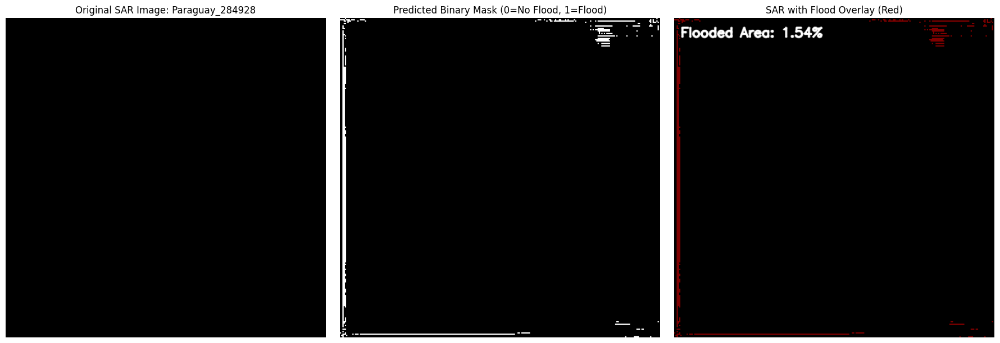


--- Debugging Mask for Pakistan_1027214 ---
Predicted mask shape: (512, 512)
Predicted mask data type: uint8
Unique values in predicted mask: [0 1]
  Value 0: 36252 pixels (13.83%)
  Value 1: 225892 pixels (86.17%)
Top-left 5x5 corner of mask:
[[0 0 0 0 0]
 [0 0 0 0 0]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 0 0 0]]


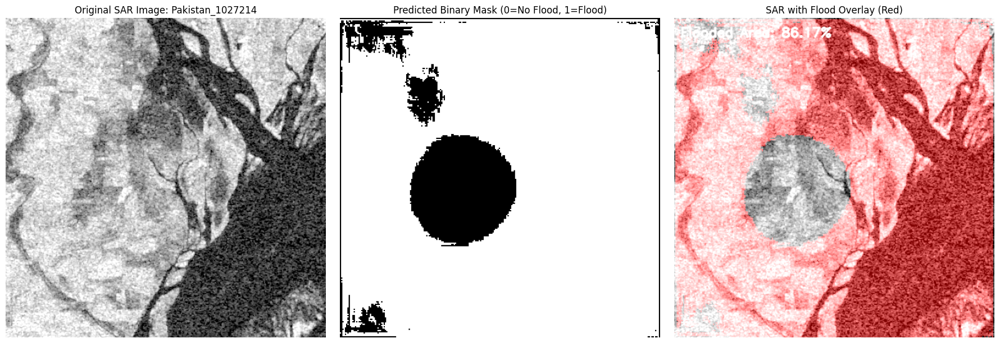


--- Debugging Mask for Ghana_168875 ---
Predicted mask shape: (512, 512)
Predicted mask data type: uint8
Unique values in predicted mask: [0 1]
  Value 0: 258104 pixels (98.46%)
  Value 1: 4040 pixels (1.54%)
Top-left 5x5 corner of mask:
[[0 0 0 0 0]
 [0 0 0 0 0]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [0 0 0 0 0]]


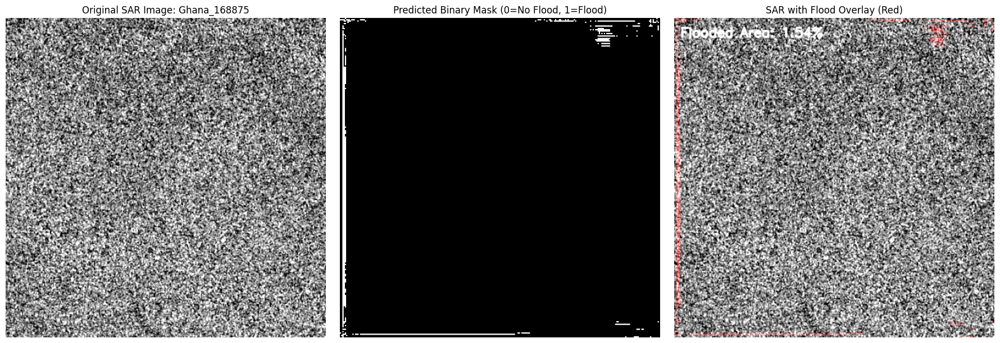


--- Debugging Mask for Pakistan_474121 ---
Predicted mask shape: (512, 512)
Predicted mask data type: uint8
Unique values in predicted mask: [0 1]
  Value 0: 37088 pixels (14.15%)
  Value 1: 225056 pixels (85.85%)
Top-left 5x5 corner of mask:
[[0 0 0 0 0]
 [0 0 0 0 0]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 0 0 0]]


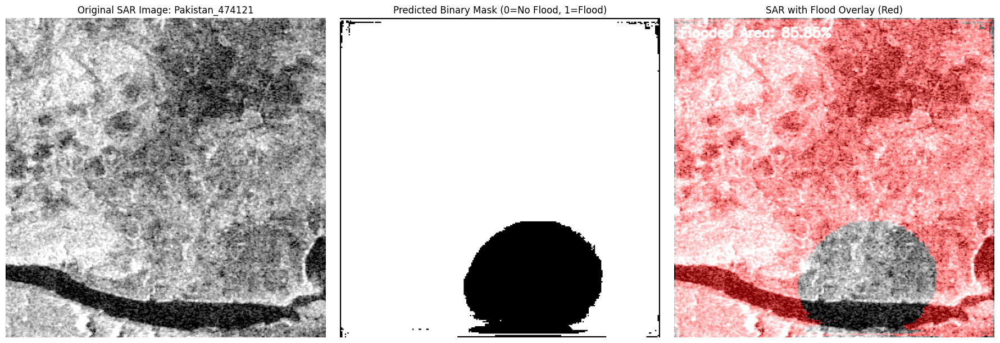


--- Debugging Mask for USA_170264 ---
Predicted mask shape: (512, 512)
Predicted mask data type: uint8
Unique values in predicted mask: [0]
  Value 0: 262144 pixels (100.00%)
Top-left 5x5 corner of mask:
[[0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]
 [0 0 0 0 0]]


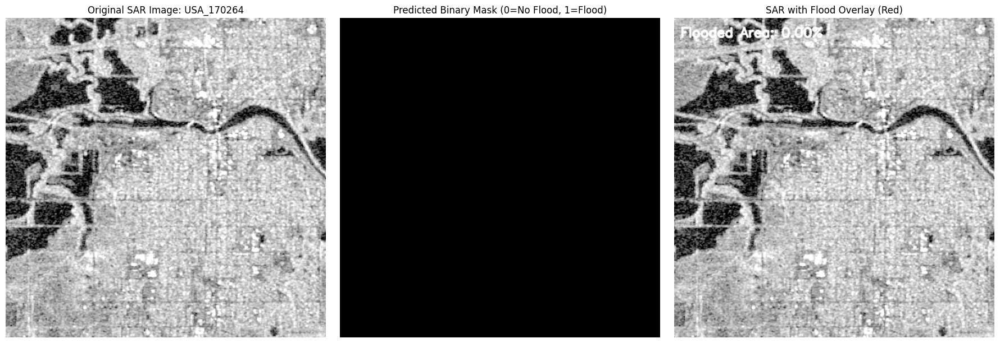

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import tifffile as tiff
from tqdm import tqdm # Import tqdm for progress bar during prediction generation

# --- Modified Visualization Function ---

def visualize_test_set_results(sar_images_dir, predicted_masks_dir, num_images_to_show=5):
    """
    Displays the original SAR image, its predicted binary mask, and the flood overlay
    for selected images from the test set.

    Args:
        sar_images_dir (str): Directory containing the original SAR image TIFF files.
        predicted_masks_dir (str): Directory containing the predicted flood mask TIFF files.
        num_images_to_show (int): Number of images to display. Set to None to display all.
    """

    # Get all matching base names
    image_filenames = sorted([f for f in os.listdir(sar_images_dir) if f.endswith('.tif')])
    mask_filenames = sorted([f for f in os.listdir(predicted_masks_dir) if f.endswith('.tif')])

    base_names_image = {f.replace('_S1Hand.tif', '') for f in image_filenames}
    base_names_predicted_mask = {f.replace('_predicted_mask.tif', '') for f in mask_filenames}

    common_base_names = sorted(list(base_names_image.intersection(base_names_predicted_mask)))

    if not common_base_names:
        print("No matching SAR image and predicted mask pairs found for visualization.")
        return

    # Shuffle for random selection if showing less than all
    if num_images_to_show is not None and num_images_to_show < len(common_base_names):
        selected_base_names = np.random.choice(common_base_names, num_images_to_show, replace=False)
    else:
        selected_base_names = common_base_names # Show all

    print(f"\n--- Displaying {len(selected_base_names)} Sample Test Set Visualizations ---")

    for i, base_name in enumerate(selected_base_names):
        current_sar_path = os.path.join(sar_images_dir, f'{base_name}_S1Hand.tif')
        current_mask_path = os.path.join(predicted_masks_dir, f'{base_name}_predicted_mask.tif')

        try:
            # 1. Load the SAR image
            sar_image = tiff.imread(current_sar_path)

            if sar_image.ndim == 3 and sar_image.shape[0] == 2:
                sar_image_display = np.mean(sar_image, axis=0)
            elif sar_image.ndim == 2:
                sar_image_display = sar_image
            else:
                print(f"WARNING: Unexpected SAR image shape for {current_sar_path}: {sar_image.shape}. Skipping.")
                continue

            p_low, p_high = np.percentile(sar_image_display, (2, 98))
            sar_image_display = np.clip(sar_image_display, p_low, p_high)
            sar_image_norm_display = cv2.normalize(sar_image_display, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)
            sar_image_color = cv2.cvtColor(sar_image_norm_display, cv2.COLOR_GRAY2BGR)

            # 2. Load the predicted flood mask
            predicted_mask = tiff.imread(current_mask_path)
            predicted_mask = (predicted_mask > 0).astype(np.uint8) # Ensure binary (0 or 1)

            # Resize mask to match SAR image dimensions (should be 256x256, but a check is good)
            if predicted_mask.shape[0] != sar_image_color.shape[0] or predicted_mask.shape[1] != sar_image_color.shape[1]:
                predicted_mask_resized = cv2.resize(predicted_mask, (sar_image_color.shape[1], sar_image_color.shape[0]), interpolation=cv2.INTER_NEAREST)
            else:
                predicted_mask_resized = predicted_mask # No resize needed if already same size

            # --- VERIFICATION PRINTS FOR DEBUGGING ---
            print(f"\n--- Debugging Mask for {base_name} ---")
            print(f"Predicted mask shape: {predicted_mask_resized.shape}")
            print(f"Predicted mask data type: {predicted_mask_resized.dtype}")
            unique_values = np.unique(predicted_mask_resized)
            print(f"Unique values in predicted mask: {unique_values}")
            if len(unique_values) <= 2:
                for val in unique_values:
                    count = np.sum(predicted_mask_resized == val)
                    print(f"  Value {val}: {count} pixels ({count / predicted_mask_resized.size * 100:.2f}%)")
            print(f"Top-left 5x5 corner of mask:\n{predicted_mask_resized[:5, :5]}")
            # --- END VERIFICATION PRINTS ---

            # 3. Create the red overlay for flood visualization
            red_overlay = np.zeros_like(sar_image_color)
            red_overlay[:, :, 2] = 255 # Set red channel to 255 (BGR format for OpenCV)

            # Apply the red overlay only where the mask is 1
            masked_region = cv2.bitwise_and(red_overlay, red_overlay, mask=predicted_mask_resized)

            # Blend the original SAR image with the red masked region
            combined_image_overlay = cv2.addWeighted(sar_image_color, 1, masked_region, 0.5, 0)

            # 4. Calculate percentage of flooded pixels
            flood_percentage = (np.sum(predicted_mask_resized) / predicted_mask_resized.size) * 100

            # 5. Add text to the overlay image
            font = cv2.FONT_HERSHEY_SIMPLEX
            text_overlay = f"Flooded Area: {flood_percentage:.2f}%"
            cv2.putText(combined_image_overlay, text_overlay, (10, 30), font, 0.7, (255, 255, 255), 2, cv2.LINE_AA)

            # --- Plotting in Subplots ---
            fig, axes = plt.subplots(1, 3, figsize=(18, 6))

            # Plot 1: Original SAR Image (Grayscale)
            axes[0].imshow(sar_image_norm_display, cmap='gray')
            axes[0].set_title(f"Original SAR Image: {base_name}")
            axes[0].axis('off')

            # Plot 2: Predicted Binary Mask - using 'gray' cmap
            # For 0=Black, 1=White, 'gray' cmap with vmin=0, vmax=1 is correct.
            # If your overlay is red for flood, and flood is 1, then the binary mask should show 1 (white) for flood.
            axes[1].imshow(predicted_mask_resized, cmap='gray', vmin=0, vmax=1)
            axes[1].set_title(f"Predicted Binary Mask (0=No Flood, 1=Flood)")
            axes[1].axis('off')

            # Plot 3: SAR with Flood Overlay
            axes[2].imshow(cv2.cvtColor(combined_image_overlay, cv2.COLOR_BGR2RGB))
            axes[2].set_title(f"SAR with Flood Overlay (Red)")
            axes[2].axis('off')

            plt.tight_layout()
            plt.show()

        except Exception as e:
            print(f"Error processing {current_sar_path} and {current_mask_path}: {e}")

# --- Example Usage (after your 50-epoch training and prediction generation) ---
# Ensure these paths are correctly defined in your environment
# Example:
# sar_images_for_display_dir = '/content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/S1Hand'
# predicted_masks_for_display_dir = '/content/drive/MyDrive/new_dataset/v1.1/data/flood_events/HandLabeled/predicted_masks_test_set_final_epoch' # Or whatever you named it

visualize_test_set_results(sar_images_for_display_dir, predicted_masks_for_display_dir, num_images_to_show=5)